# Uneven Science–Policy Translation Shapes Global AI Governance — Publication Visuals
**Authors:** Tambudzai G. Charumbira & Joshua Gray | GWU CCAS | M.S. Data Science | Spring 2026

This notebook contains **20 Altair visualizations** (5 per section) generating the publication-ready charts
used in the capstone paper and poster. All charts are saved as PNG files to the `charts/` directory.

**Sections:**
1. 🔍 RO1 — Dominant Governance Themes & Temporal Analysis
2. 🌍 RO2 — Regional & Spatial Distribution
3. 📜 RO3 — Academic vs Policy Alignment
4. 💬 Stance Analysis — Risk vs Opportunity Framing

**Data sources:** All inputs loaded from `results/` and `data_clean/` directories (outputs of scripts 1–4d).

**Note:** The Streamlit dashboard (5_streamlit_dashboard.py) provides interactive Plotly versions of these
charts. This notebook generates the static Altair versions used in the paper.

## ⚙️ Setup & Data Loading

In [1]:
# Install if needed:
# pip install altair vega_datasets pycountry networkx nbformat

import warnings
warnings.filterwarnings('ignore')
import altair as alt
import pandas as pd
import numpy as np
import networkx as nx
from vega_datasets import data as vega_data
from pathlib import Path
alt.data_transformers.disable_max_rows()

def find_root():
    for p in [Path.cwd(), Path.cwd().parent, Path.cwd().parent.parent]:
        if (p / 'results').exists() and (p / 'data_clean').exists():
            return p
    raise FileNotFoundError('Could not find project root with results/ and data_clean/')

ROOT       = find_root()
RESULTS    = ROOT / 'results'
DATA_CLEAN = ROOT / 'data_clean'
print(f'Project root: {ROOT}')

BLUE   = '#1F4E79'
MID    = '#2E75B6'
LIGHT  = '#BDD7EE'
GREEN  = '#1E7145'
AMBER  = '#C55A11'
RED    = '#C00000'
PURPLE = '#7030A0'
TEAL   = '#008080'

REGION_DOMAIN  = ['Europe','Asia-Pacific','North America','Africa & Middle East','Latin America','Other / Unclassified']
REGION_RANGE   = [MID, TEAL, GREEN, AMBER, PURPLE, '#888888']

STANCE_DOMAIN  = ['risk_focused','opportunity_focused','balanced']
STANCE_RANGE   = [RED, GREEN, '#AAAAAA']

Project root: /Users/tg.charumbira/PycharmProjects/AI-Research-Analysis-Capstone


In [2]:
# ── LOADING ALL DATA ────────────────────────────────────────────────────────────
def sr(f, **kw):
    p = RESULTS / f
    if not p.exists(): p = DATA_CLEAN / f
    return pd.read_csv(p, dtype=str, low_memory=False, **kw) if p.exists() else pd.DataFrame()

papers   = sr('governance_papers_stance.csv')
s_topic  = sr('stance_by_topic.csv')
s_region = sr('stance_by_region.csv')
s_period = sr('stance_by_period.csv')
s_policy = sr('stance_policy_comparison.csv')
gov_top  = sr('governance_topics.csv')
reg_gov  = sr('region_governance_distribution.csv')
per_gov  = sr('period_governance_distribution.csv')
align    = sr('cross_corpus_alignment_v2.csv')
pol_docs = sr('policy_document_topics_v2.csv')
edges    = sr('scopus_country_edges.csv')
nodes    = sr('scopus_country_nodes.csv')

for df, cols in [
    (papers,   ['governance_score','score_risk','score_opportunity','score_balanced','topic_id_finetuned']),
    (s_topic,  ['balanced','opportunity_focused','risk_focused','avg_risk_score','avg_opportunity_score','paper_count','topic_id_finetuned']),
    (s_region, ['balanced','opportunity_focused','risk_focused','avg_risk_score','avg_opportunity_score','paper_count']),
    (s_period, ['balanced','opportunity_focused','risk_focused','avg_risk_score','avg_opportunity_score','paper_count']),
    (s_policy, ['academic_papers','academic_risk_score','academic_opportunity_score','policy_count']),
    (gov_top,  ['governance_score','paper_count']),
    (reg_gov,  ['count','total','proportion']),
    (per_gov,  ['count','total','proportion']),
    (align,    ['scopus_count','policy_count','governance_score']),
    (edges,    ['weight']),
    (nodes,    ['latitude','longitude','total_papers']),
]:
    for c in cols:
        if c in df.columns:
            df[c] = pd.to_numeric(df[c], errors='coerce')

papers['year'] = papers['cover_date'].astype(str).str[:4]
papers['year'] = pd.to_numeric(papers['year'], errors='coerce')

print(' All data loaded')
print(f'   Governance papers: {len(papers):,}')
print(f'   Country edges:     {len(edges):,}')
print(f'   Country nodes:     {len(nodes):,}')

✅ All data loaded
   Governance papers: 3,186
   Country edges:     2,410
   Country nodes:     138


In [3]:
# ── ISO COUNTRY CODE MAPPING (for world map) ─────────────────────────────────
# ISO 3166-1 numeric codes used by vega world_110m topojson
COUNTRY_ISO = {
    'China':756,'United States':840,'India':356,'United Kingdom':826,
    'Germany':276,'South Korea':410,'Italy':380,'Australia':36,
    'Spain':724,'Canada':124,'France':250,'Japan':392,'Brazil':76,
    'Netherlands':528,'Saudi Arabia':682,'Malaysia':458,'Pakistan':586,
    'Turkey':792,'Portugal':620,'Poland':616,'Switzerland':756,
    'Sweden':752,'Belgium':56,'Iran':364,'Greece':300,'Egypt':818,
    'Nigeria':566,'South Africa':710,'Singapore':702,'Taiwan':158,
    'Hong Kong':344,'Indonesia':360,'Mexico':484,'Colombia':170,
    'Chile':152,'Argentina':32,'Russia':643,'Ukraine':804,
    'Czech Republic':203,'Denmark':208,'Finland':246,'Norway':578,
    'Austria':40,'Romania':642,'Israel':376,'Jordan':400,'Iraq':368,
    'Morocco':504,'Bangladesh':50,'Qatar':634,'United Arab Emirates':784,
    'UAE':784,'Kenya':404,'Ethiopia':231,'Ghana':288,'Rwanda':646,
    'Zimbabwe':716,'Algeria':12,'Tunisia':788,'Algeria':12,
    'New Zealand':554,'Philippines':608,'Thailand':764,'Vietnam':704,
    'Nepal':524,'Peru':604,'Ecuador':218,'Uruguay':858,'Hungary':348,
    'Slovakia':703,'Bulgaria':100,'Croatia':191,'Serbia':688,
    'Lithuania':440,'Ireland':372,'Slovenia':705,'Venezuela':862,
    'Bolivia':68,'Paraguay':600,'Kosovo':383,'Albania':8,
    'North Macedonia':807,'Montenegro':499,'Cyprus':196,
    'Sudan':729,'Tanzania':834,'Uganda':800,'Zambia':894,
    'Senegal':686,'Ivory Coast':384,'Angola':24,'Mozambique':508,
    'Cameroon':120,'Libya':434,'Somalia':706,
    'Sri Lanka':144,'Myanmar':104,'Cambodia':116,'Laos':418,
    'Mongolia':496,'Kazakhstan':398,'Uzbekistan':860,
    'Azerbaijan':31,'Georgia':268,'Armenia':51,'Belarus':112,
    'Moldova':498,'Estonia':233,'Latvia':428,'Iceland':352,
    'Luxembourg':442,'Malta':470,'Liechtenstein':438,'Monaco':492,
    'Andorra':20,'San Marino':674,'Bosnia and Herzegovina':70,
    'Bahrain':48,'Kuwait':414,'Oman':512,'Lebanon':422,'Syria':760,
    'Yemen':887,'Afghanistan':4,'Kyrgyzstan':417,'Tajikistan':762,
    'Turkmenistan':795,'Cuba':192,'Dominican Republic':214,
    'Guatemala':320,'Honduras':340,'El Salvador':222,'Nicaragua':558,
    'Costa Rica':188,'Panama':591,'Jamaica':388,'Trinidad and Tobago':780,
}
COUNTRY_ISO['China'] = 156
ISO_COUNTRY = {v: k for k, v in COUNTRY_ISO.items()}
print(f' Country ISO map: {len(COUNTRY_ISO)} entries')

✅ Country ISO map: 136 entries


---
## 🔍 RO1 — Dominant Governance Themes

> *What are the dominant AI risk and governance themes in academic discourse, and how have they evolved over time?*

**5 visualisations:**
1. Governance Topic Bubble Chart (risk score × opportunity score)
2. Topic Evolution Heatmap (year × topic)
3. Growth Slope Chart (pre vs post ChatGPT)
4. Stacked Area — Topic Volume 2015–2025
5. Topic Governance Score vs Paper Count

### Visual 1.1 — Governance Topic Bubble Chart
Each bubble = one governance topic. Position = framing (x=risk, y=opportunity), size = paper count, colour = governance relevance score.

In [4]:
bubble_data = s_topic.copy()
def smart_trim(name, limit=45):
    name = name.strip()
    if len(name) <= limit:
        return name
    return name[:limit].rsplit(' ', 1)[0] + '…'

key_topics = [
    'AI Law, Ethics & Human Rights',
    'AI Cybersecurity & IoT Threats',
    'Generative AI & Creative Ethics',
    'EU AI Regulation & Regulatory Frameworks',
    'Autonomous Weapons & Military AI',
    'Algorithmic Fairness & Bias',
    'AI Accessibility & Disability Inclusion',
]
skip_labels = [
    'AI Ethics from Islamic/Religious Perspective',
    'Predictive Policing & Criminal Justice AI',
    'AI Governance during COVID-19',
]
minor_right = [
    'UAV & Drone Governance',
    'AI Patent Law & Intellectual Property',
]
bubble_data['label'] = bubble_data['topic_label_finetuned'].apply(smart_trim)
bubble_data['is_key'] = bubble_data['topic_label_finetuned'].isin(key_topics)

bubble_data['key_label'] = bubble_data.apply(
    lambda r: r['label'] if r['is_key'] else '', axis=1)
bubble_data['minor_left_label'] = bubble_data.apply(
    lambda r: r['label'] if (not r['is_key']
        and r['topic_label_finetuned'] not in skip_labels
        and r['topic_label_finetuned'] not in minor_right) else '', axis=1)
bubble_data['minor_right_label'] = bubble_data.apply(
    lambda r: r['label'] if r['topic_label_finetuned'] in minor_right else '', axis=1)

opp_zone = alt.Chart(pd.DataFrame({
    'x': [0, 0, 0.80], 'y': [0, 0.80, 0.80]
})).mark_area(color='#d4e8fc', opacity=0.10).encode(
    x=alt.X('x:Q', scale=alt.Scale(domain=[0, 0.80])),
    y=alt.Y('y:Q', scale=alt.Scale(domain=[0, 0.80]))
)
risk_zone = alt.Chart(pd.DataFrame({
    'x': [0, 0.80, 0.80], 'y': [0, 0.80, 0]
})).mark_area(color='#f8d4d4', opacity=0.10).encode(x='x:Q', y='y:Q')

zone_labels = alt.Chart(pd.DataFrame({
    'x': [0.08, 0.65], 'y': [0.72, 0.08],
    'text': ['OPPORTUNITY-DOMINANT ↑', 'RISK-DOMINANT →']
})).mark_text(fontSize=10, fontWeight='bold', opacity=0.18).encode(
    x='x:Q', y='y:Q', text='text:N'
)

selection = alt.selection_point(on='pointerover', empty=False)
all_bubbles = alt.Chart(bubble_data).mark_circle(strokeWidth=1).encode(
    x=alt.X('avg_risk_score:Q', scale=alt.Scale(domain=[0, 0.80]),
            axis=alt.Axis(title='Average Risk Score →', grid=False)),
    y=alt.Y('avg_opportunity_score:Q', scale=alt.Scale(domain=[0, 0.80]),
            axis=alt.Axis(title='Average Opportunity Score →', grid=False)),
    size=alt.Size('paper_count:Q', scale=alt.Scale(range=[150, 2500]),
                  legend=alt.Legend(title='Papers')),
    color=alt.Color('avg_risk_score:Q',
                    scale=alt.Scale(scheme='redblue', reverse=True, domainMid=0.35),
                    legend=alt.Legend(title='Risk Score')),
    opacity=alt.condition(alt.datum.is_key, alt.value(0.9), alt.value(0.55)),
    stroke=alt.condition(alt.datum.is_key, alt.value('#333'), alt.value('#aaa')),
    strokeWidth=alt.condition(selection, alt.value(3), alt.value(1)),
    tooltip=[
        alt.Tooltip('topic_label_finetuned:N', title='Topic'),
        alt.Tooltip('paper_count:Q', title='Papers'),
        alt.Tooltip('avg_risk_score:Q', title='Avg Risk Score', format='.3f'),
        alt.Tooltip('avg_opportunity_score:Q', title='Avg Opp Score', format='.3f'),
        alt.Tooltip('dominant_stance:N', title='Dominant Stance'),
    ]
).add_params(selection)

key_base = alt.Chart(bubble_data).encode(
    x='avg_risk_score:Q', y='avg_opportunity_score:Q', text='key_label:N')
key_halo = key_base.mark_text(fontSize=8.5, fontWeight='bold',
    dx=18, align='left', stroke='white', strokeWidth=4, color='white')
key_text = key_base.mark_text(fontSize=8.5, fontWeight='bold',
    dx=18, align='left', color='#111')

ml_base = alt.Chart(bubble_data).encode(
    x='avg_risk_score:Q', y='avg_opportunity_score:Q', text='minor_left_label:N')
ml_halo = ml_base.mark_text(fontSize=7.5, fontWeight='normal',
    dx=-18, align='right', stroke='white', strokeWidth=3, color='white')
ml_text = ml_base.mark_text(fontSize=7.5, fontWeight='normal',
    dx=-18, align='right', color='#555')

mr_base = alt.Chart(bubble_data).encode(
    x='avg_risk_score:Q', y='avg_opportunity_score:Q', text='minor_right_label:N')
mr_halo = mr_base.mark_text(fontSize=7.5, fontWeight='normal',
    dx=14, align='left', stroke='white', strokeWidth=3, color='white')
mr_text = mr_base.mark_text(fontSize=7.5, fontWeight='normal',
    dx=14, align='left', color='#555')

diag = pd.DataFrame({'x': [0, 0.80], 'y': [0, 0.80]})
diag_line = alt.Chart(diag).mark_line(
    strokeDash=[4, 4], color='#999', opacity=0.4
).encode(x='x:Q', y='y:Q')
diag_label = alt.Chart(pd.DataFrame({'x': [0.60], 'y': [0.64]})).mark_text(
    text='Risk = Opportunity', fontSize=9, angle=40,
    color='#999', fontStyle='italic'
).encode(x='x:Q', y='y:Q')

v1 = (opp_zone + risk_zone + zone_labels + diag_line + diag_label
      + all_bubbles
      + key_halo + key_text
      + ml_halo + ml_text
      + mr_halo + mr_text
).properties(
    width=780, height=540,
    title=alt.TitleParams(
        'Governance Topics: Risk vs Opportunity Framing',
        subtitle='Bubble size = paper count | Position = avg stance scores | Colour = risk intensity | Bold outline = key topics',
        fontSize=15, subtitleFontSize=11
    )
).configure_view(strokeWidth=0).configure_axis(labelFontSize=10)

v1

alt.LayerChart(...)

### Visual 1.2 — Topic Evolution Heatmap (2015–2025)
How has each governance topic grown year by year?

In [5]:
# Build year × topic counts
year_topic = papers.groupby(['year', 'topic_label_finetuned']).size().reset_index(name='count')
year_topic = year_topic[year_topic['year'].between(2015, 2025)]

# ── Fill missing years with 0 ──
from itertools import product
all_years = list(range(2015, 2026))
all_topics = year_topic['topic_label_finetuned'].unique().tolist()
full_grid = pd.DataFrame(list(product(all_years, all_topics)),
                         columns=['year', 'topic_label_finetuned'])
year_topic = full_grid.merge(year_topic, on=['year', 'topic_label_finetuned'], how='left')
year_topic['count'] = year_topic['count'].fillna(0).astype(int)

# ── Sort by total papers ──
topic_totals = year_topic.groupby('topic_label_finetuned')['count'].sum().sort_values(ascending=False)
topic_order = topic_totals.index.tolist()

def short_name(name, limit=45):
    name = name.strip()
    if len(name) <= limit:
        return name
    return name[:limit].rsplit(' ', 1)[0] + '…'

year_topic['short_label'] = year_topic['topic_label_finetuned'].apply(short_name)
short_order = [short_name(t) for t in topic_order]

year_topic['chatgpt_year'] = 2023

# ═══════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════
# VISUAL 1.2a — SMALL MULTIPLES (7 cols × 3 rows, each topic different colour)
# ═══════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════

area = alt.Chart(year_topic).mark_area(
    opacity=0.7, line={'strokeWidth': 1.5}
).encode(
    x=alt.X('year:Q',
            scale=alt.Scale(domain=[2015, 2025]),
            axis=alt.Axis(title=None, format='d', tickCount=3,
                          labelFontSize=7, values=[2015, 2020, 2025])),
    y=alt.Y('count:Q',
            axis=alt.Axis(title=None, tickCount=3, labelFontSize=7)),
    color=alt.Color('short_label:N', sort=short_order, legend=None),
    tooltip=[
        alt.Tooltip('topic_label_finetuned:N', title='Topic'),
        alt.Tooltip('year:Q', title='Year', format='d'),
        alt.Tooltip('count:Q', title='Papers'),
    ]
)

rule = alt.Chart(year_topic).mark_rule(
    color=RED, strokeWidth=1.5, strokeDash=[4, 3], opacity=0.7
).encode(x='chatgpt_year:Q')

v1_2a = alt.layer(area, rule, data=year_topic).properties(
    width=110, height=80
).facet(
    facet=alt.Facet('short_label:N',
                    sort=short_order,
                    title=None,
                    header=alt.Header(
                        labelFontSize=7.5,
                        labelFontWeight='bold',
                        labelOrient='top',
                        labelPadding=2
                    )),
    columns=7
).resolve_scale(
    y='independent'
).properties(
    title=alt.TitleParams(
        'AI Governance Topic Growth Trajectories (2015–2025)',
        subtitle='Each panel = one governance topic | Red line = ChatGPT launch (Nov 2022) | Y-scales independent',
        fontSize=14, subtitleFontSize=10
    )
)

v1_2a

alt.FacetChart(...)

In [6]:
# ═══════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════
# VISUAL 1.2b — COMBINED LINE CHART (all topics, coloured by topic)
# ═══════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════

# Top 7 topics get labels at the end of the line
top7 = topic_order[:7]
year_topic['is_top7'] = year_topic['topic_label_finetuned'].isin(top7)

# End labels for top 7
end_labels = year_topic[(year_topic['year'] == 2025) & (year_topic['is_top7'])]

# ── Lines ──
# ── Lines ──
lines = alt.Chart(year_topic).mark_line(strokeWidth=1.5).encode(
    x=alt.X('year:Q',
            scale=alt.Scale(domain=[2015, 2025]),
            axis=alt.Axis(title='Year', format='d', labelAngle=0)),
    y=alt.Y('count:Q',
            axis=alt.Axis(title='Papers per Year')),
    color=alt.Color('short_label:N', sort=short_order, legend=None),
    opacity=alt.condition(
        alt.datum.is_top7,
        alt.value(1.0),
        alt.value(0.25)
    ),
    strokeWidth=alt.condition(
        alt.datum.is_top7,
        alt.value(2.5),
        alt.value(1)
    ),
)

# ── Points on each year ──
points = alt.Chart(year_topic).mark_circle(size=30).encode(
    x='year:Q',
    y='count:Q',
    color=alt.Color('short_label:N', sort=short_order, legend=None),
    opacity=alt.condition(
        alt.datum.is_top7,
        alt.value(0.9),
        alt.value(0.15)
    ),
    tooltip=[
        alt.Tooltip('topic_label_finetuned:N', title='Topic'),
        alt.Tooltip('year:Q', title='Year', format='d'),
        alt.Tooltip('count:Q', title='Papers'),
    ]
)

# ── End labels for top 7 ──
end_text = alt.Chart(end_labels).mark_text(
    align='left', dx=5, fontSize=8, fontWeight='bold'
).encode(
    x='year:Q',
    y='count:Q',
    text='short_label:N',
    color=alt.Color('short_label:N', sort=short_order, legend=None)
)

# ── ChatGPT line ──
chatgpt_line = alt.Chart(pd.DataFrame({'year': [2023]})).mark_rule(
    color=RED, strokeWidth=2, strokeDash=[6, 3], opacity=0.7
).encode(x='year:Q')

chatgpt_text = alt.Chart(pd.DataFrame({'year': [2023], 'count': [230]})).mark_text(
    text='ChatGPT', fontSize=9, fontWeight='bold', color=RED, dx=25
).encode(x='year:Q', y='count:Q')

v1_2b = (lines + points + end_text + chatgpt_line + chatgpt_text).properties(
    width=700, height=420,
    title=alt.TitleParams(
        'AI Governance Topic Growth Over Time (2015–2025)',
        subtitle='Top 7 topics highlighted | Red line = ChatGPT launch (Nov 2022)',
        fontSize=15, subtitleFontSize=11
    )
).configure_view(strokeWidth=0).configure_axis(labelFontSize=10, grid=False)

v1_2b

alt.LayerChart(...)

### Visual 1.3 — Pre vs Post ChatGPT Growth (Slope Chart)
Which governance topics grew most dramatically after ChatGPT?

In [7]:
# ── Build growth data ──
pre_counts = papers[papers['period'] == 'pre_chatgpt'].groupby('topic_label_finetuned').size().reset_index(name='pre_count')
post_counts = papers[papers['period'] == 'post_chatgpt'].groupby('topic_label_finetuned').size().reset_index(name='post_count')
growth = pre_counts.merge(post_counts, on='topic_label_finetuned', how='outer').fillna(0)
growth['abs_change'] = (growth['post_count'] - growth['pre_count']).astype(int)
growth['growth_pct'] = ((growth['post_count'] - growth['pre_count']) / growth['pre_count'].clip(lower=1) * 100).round(0)

def smart_trim(name, limit=42):
    name = name.strip()
    if len(name) <= limit:
        return name
    return name[:limit].rsplit(' ', 1)[0] + '…'

growth['label'] = growth['topic_label_finetuned'].apply(smart_trim)

# Sort by absolute change
topic_sort = growth.sort_values('abs_change', ascending=False)['label'].tolist()

# ── Melt for grouped bars ──
melted = growth.melt(
    id_vars=['topic_label_finetuned', 'label', 'abs_change', 'growth_pct'],
    value_vars=['pre_count', 'post_count'],
    var_name='period', value_name='papers'
)
melted['period_label'] = melted['period'].map({
    'pre_count': 'Pre-ChatGPT (2015–21)',
    'post_count': 'Post-ChatGPT (2022–25)'
})

# ── Grouped bar chart ──
bars = alt.Chart(melted).mark_bar(
    cornerRadiusEnd=2
).encode(
    x=alt.X('papers:Q', axis=alt.Axis(title='Number of Papers', grid=False)),
    y=alt.Y('label:N', sort=topic_sort, axis=alt.Axis(title=None, labelLimit=300)),
    color=alt.Color('period_label:N',
                    scale=alt.Scale(
                        domain=['Pre-ChatGPT (2015–21)', 'Post-ChatGPT (2022–25)'],
                        range=['#a1d9ce', '#1a9878']
                    ),
                    legend=alt.Legend(title='Period', orient='top')),
    yOffset='period_label:N',
    tooltip=[
        alt.Tooltip('topic_label_finetuned:N', title='Topic'),
        alt.Tooltip('period_label:N', title='Period'),
        alt.Tooltip('papers:Q', title='Papers'),
        alt.Tooltip('growth_pct:Q', title='Growth %', format='+.0f'),
    ]
)

# ── Growth % annotation at end of post bar ──
post_data = melted[melted['period'] == 'post_count'].copy()
growth_labels = alt.Chart(post_data).mark_text(
    align='left', dx=4, fontSize=8, fontWeight='bold', color='#555'
).encode(
    x='papers:Q',
    y=alt.Y('label:N', sort=topic_sort),
    text=alt.Text('growth_pct:Q', format='+.0f'),
)

v3 = (bars + growth_labels).properties(
    width=550, height=400,
    title=alt.TitleParams(
        'Pre vs Post ChatGPT: Governance Topic Growth',
        subtitle='Sorted by absolute increase | Numbers show growth % | Light = pre, Dark = post',
        fontSize=15, subtitleFontSize=11
    )
).configure_view(strokeWidth=0).configure_axis(labelFontSize=10)

v3

alt.LayerChart(...)

### Visual 1.4 — Stacked Area: Governance Research Volume 2015–2025

In [8]:
# Papers per year per topic
area_data = papers.groupby(['year','topic_label_finetuned']).size().reset_index(name='count')
area_data = area_data[area_data['year'].between(2015, 2025)]

# ── Top 8 + "Other" for completeness ──
top8 = papers['topic_label_finetuned'].value_counts().head(8).index.tolist()
area_data['topic_group'] = area_data['topic_label_finetuned'].apply(
    lambda t: t if t in top8 else 'Other (13 topics)'
)
area_grouped = area_data.groupby(['year', 'topic_group'])['count'].sum().reset_index()

# ── Sort order: top 8 by total count desc, then Other at bottom ──
group_totals = area_grouped.groupby('topic_group')['count'].sum().sort_values(ascending=False)
stack_order = [t for t in group_totals.index if t != 'Other (13 topics)'] + ['Other (13 topics)']

# ── Fill missing year × topic combos with 0 ──
from itertools import product
all_years = sorted(area_grouped['year'].unique())
full_grid = pd.DataFrame(list(product(all_years, stack_order)),
                         columns=['year', 'topic_group'])
area_grouped = full_grid.merge(area_grouped, on=['year', 'topic_group'], how='left')
area_grouped['count'] = area_grouped['count'].fillna(0).astype(int)

# ── Custom colours: 8 distinct + grey for Other ──
custom_colors = ['#4e79a7', '#f28e2b', '#e15759', '#76b7b2',
                 '#59a14f', '#edc948', '#b07aa1', '#ff9da7', '#bab0ac']

v4 = alt.Chart(area_grouped).mark_area(opacity=0.85).encode(
    x=alt.X('year:O',
            axis=alt.Axis(title='Year', labelAngle=0, labelFontSize=11)),
    y=alt.Y('count:Q',
            stack='zero',
            axis=alt.Axis(title='Governance Papers Published', grid=False)),
    color=alt.Color('topic_group:N',
                    sort=stack_order,
                    scale=alt.Scale(domain=stack_order, range=custom_colors),
                    legend=alt.Legend(title='Topic', orient='right', labelLimit=350)),
    order=alt.Order('topic_order:Q'),
    tooltip=[
        alt.Tooltip('topic_group:N', title='Topic'),
        alt.Tooltip('year:O', title='Year'),
        alt.Tooltip('count:Q', title='Papers'),
    ]
).transform_calculate(
    topic_order=f"indexof({stack_order}, datum.topic_group)"
).properties(
    width=680, height=400,
    title=alt.TitleParams(
        'Growth in AI Governance Research Volume (2015–2025)',
        subtitle='Stacked areas show cumulative growth across top 8 topics + Other | Red line = ChatGPT launch',
        fontSize=15, subtitleFontSize=11
    )
)

chatgpt_rule = alt.Chart(pd.DataFrame({'year': [2023]})).mark_rule(
    color=RED, strokeWidth=2, strokeDash=[5, 4]
).encode(x='year:O')

chatgpt_text = alt.Chart(pd.DataFrame({'year': [2023], 'count': [950]})).mark_text(
    text='ChatGPT →', color=RED, fontSize=9, fontWeight='bold', dx=20
).encode(x='year:O', y='count:Q')

(v4 + chatgpt_rule + chatgpt_text).configure_view(strokeWidth=0).configure_axis(labelFontSize=10)

alt.LayerChart(...)

### Visual 1.5 — Governance Relevance Score vs Paper Count

In [9]:
v5 = alt.Chart(gov_top).mark_circle(opacity=0.9).encode(
    x=alt.X('paper_count:Q',
            scale=alt.Scale(type='log'),
            axis=alt.Axis(title='Paper Count (log scale)')),
    y=alt.Y('governance_score:Q',
            scale=alt.Scale(domain=[0.45, 1.05]),
            axis=alt.Axis(title='Governance Relevance Score')),
    size=alt.Size('paper_count:Q',
                  scale=alt.Scale(range=[80, 1800]),
                  legend=None),
    color=alt.Color('governance_score:Q',
                    scale=alt.Scale(scheme='goldgreen'),
                    legend=alt.Legend(title='Gov. Score')),
    tooltip=[
        alt.Tooltip('topic_label:N', title='Topic'),
        alt.Tooltip('paper_count:Q', title='Papers'),
        alt.Tooltip('governance_score:Q', title='Gov. Score', format='.2f'),
        alt.Tooltip('top_words:N', title='Keywords'),
    ]
).properties(width=560, height=420)

text5 = alt.Chart(gov_top).mark_text(fontSize=9, dy=-13, color='#333').encode(
    x=alt.X('paper_count:Q', scale=alt.Scale(type='log')),
    y=alt.Y('governance_score:Q', scale=alt.Scale(domain=[0.45, 1.05])),
    text=alt.Text('topic_label:N',
                  condition=alt.condition(
                      alt.datum.paper_count > 80,
                      alt.value(None),
                      alt.value(None)
                  ))
)

# Custom text for top topics
top_labels = gov_top[gov_top['paper_count'] > 60].copy()
top_labels['short'] = top_labels['topic_label'].str[:25]
text5b = alt.Chart(top_labels).mark_text(fontSize=8, dy=-13, color='#333').encode(
    x=alt.X('paper_count:Q', scale=alt.Scale(type='log')),
    y=alt.Y('governance_score:Q', scale=alt.Scale(domain=[0.45, 1.05])),
    text='short:N'
)

# Reference lines
ref_h = alt.Chart(pd.DataFrame({'y': [0.9]})).mark_rule(
    strokeDash=[4,3], color=AMBER, opacity=0.6
).encode(y='y:Q')
ref_v = alt.Chart(pd.DataFrame({'x': [100]})).mark_rule(
    strokeDash=[4,3], color=AMBER, opacity=0.6
).encode(x='x:Q')

(v5 + text5b + ref_h + ref_v).properties(
    title=alt.TitleParams(
        'Governance Relevance vs Research Volume',
        subtitle='Top-right = high relevance AND high volume (most impactful topics)',
        fontSize=15, subtitleFontSize=11
    )
).configure_view(strokeWidth=1).configure_axis(labelFontSize=10)

alt.LayerChart(...)

In [10]:
# ── Overall stance breakdown ──
stance_counts = papers.groupby('stance').size().reset_index(name='count')
stance_counts['pct'] = (stance_counts['count'] / stance_counts['count'].sum() * 100).round(1)
stance_counts['label'] = stance_counts.apply(
    lambda r: r['stance'].replace('_focused', '').replace('_', ' ').title() + ': ' + str(r['pct']) + '%',
    axis=1
)

stance_order = ['risk_focused', 'balanced', 'opportunity_focused']
stance_colors = ['#e15759', '#76b7b2', '#4e79a7']

bar = alt.Chart(stance_counts).mark_bar(
    cornerRadius=4, height=60
).encode(
    x=alt.X('count:Q', stack='zero',
            axis=alt.Axis(title='Number of Papers', grid=False)),
    color=alt.Color('stance:N',
                    sort=stance_order,
                    scale=alt.Scale(domain=stance_order, range=stance_colors),
                    legend=None),
    order=alt.Order('stance:N', sort='ascending'),
    tooltip=[
        alt.Tooltip('stance:N', title='Stance'),
        alt.Tooltip('count:Q', title='Papers'),
        alt.Tooltip('pct:Q', title='%', format='.1f'),
    ]
)

# ── Labels inside each segment ──
bar_text = alt.Chart(stance_counts).mark_text(
    fontSize=14, fontWeight='bold', color='white'
).encode(
    x=alt.X('mid:Q'),
    text='label:N',
    order=alt.Order('stance:N', sort='ascending'),
).transform_window(
    cumcount='sum(count)',
    sort=[{'field': 'stance'}]
).transform_calculate(
    mid='datum.cumcount - datum.count / 2'
)

v1_6 = (bar + bar_text).properties(
    width=650, height=80,
    title=alt.TitleParams(
        'Overall Governance Stance Distribution (n = 3,186 papers)',
        subtitle='How do academics frame AI governance? Risk, opportunity, or balanced?',
        fontSize=15, subtitleFontSize=11
    )
).configure_view(strokeWidth=0).configure_axis(labelFontSize=10)

v1_6

alt.LayerChart(...)

---
## 🌍 RO2 — Regional & Spatial Distribution

> *How is AI governance discourse distributed across world regions and countries?*

**5 visualisations:**
1. World Choropleth Map — governance papers by country
2. Co-authorship Network — country collaboration graph
3. Regional Governance Topic Heatmap
4. Dot Map — country positions sized by paper count
5. Radar Chart — regional governance profiles

### Visual 2.1 — World Choropleth Map
**Countries coloured by number of governance papers.** This requires `vega_datasets` with the world_110m topojson.

In [11]:
# ── Use nodes for full Scopus country counts ──
full_counts = nodes.copy()
full_counts['id'] = full_counts['country'].map(COUNTRY_ISO)
full_counts = full_counts.dropna(subset=['id'])
full_counts['id'] = full_counts['id'].astype(int)
full_counts['country_label'] = full_counts['country']

world_topo = alt.topo_feature(vega_data.world_110m.url, 'countries')

background = alt.Chart(world_topo).mark_geoshape(
    fill='#e8e0d8', stroke='white', strokeWidth=0.5
)

choropleth = alt.Chart(world_topo).mark_geoshape(
    stroke='white', strokeWidth=0.5
).encode(
    color=alt.Color('total_papers:Q',
                    scale=alt.Scale(type='log', scheme='orangered', domainMin=1),
                    legend=alt.Legend(
                        title='Total Papers', orient='bottom-left',
                        direction='horizontal', gradientLength=250,
                        gradientThickness=12, titleFontSize=11,
                        labelFontSize=9, offset=10
                    )),
    tooltip=[
        alt.Tooltip('country_label:N', title='Country'),
        alt.Tooltip('total_papers:Q', title='Total Papers', format=','),
    ]
).transform_lookup(
    lookup='id',
    from_=alt.LookupData(full_counts, 'id', ['total_papers', 'country_label'])
)

top10 = full_counts.nlargest(10, 'total_papers').copy()
top10['display'] = top10.apply(lambda r: f"{r['country_label']}: {r['total_papers']:,}", axis=1)

lbl_halo = alt.Chart(top10).mark_text(
    fontSize=8.5, fontWeight='bold', stroke='white', strokeWidth=3, color='white'
).encode(longitude='lon:Q', latitude='lat:Q', text='display:N')
lbl_text = alt.Chart(top10).mark_text(
    fontSize=8.5, fontWeight='bold', color='#333'
).encode(longitude='lon:Q', latitude='lat:Q', text='display:N')

the_map = (background + choropleth + lbl_halo + lbl_text).project(
    type='naturalEarth1'
).properties(width=850, height=460)

# ── Region bar: continuous, low to high, Other at end ──
region_totals = nodes.groupby('region')['total_papers'].sum().reset_index()
# Separate "Other" if exists, otherwise create it
known_regions = ['Latin America', 'Africa & Middle East', 'North America', 'Europe', 'Asia-Pacific', 'Central & South Asia']
region_totals['is_other'] = ~region_totals['region'].isin(known_regions)

# Sort: ascending by papers, Other at end
main = region_totals[~region_totals['is_other']].sort_values('total_papers', ascending=True)
other = region_totals[region_totals['is_other']]
if not other.empty:
    other_row = pd.DataFrame({'region': ['Other'], 'total_papers': [other['total_papers'].sum()], 'is_other': [True]})
else:
    other_row = pd.DataFrame({'region': ['Other'], 'total_papers': [0], 'is_other': [True]})
region_sorted = pd.concat([main, other_row], ignore_index=True)
region_sorted['label'] = region_sorted.apply(
    lambda r: f"{r['region']}: {r['total_papers']:,}", axis=1
)
region_sorted['sort_order'] = range(len(region_sorted))

region_colors_map = {
    'Latin America': '#feedde',
    'Africa & Middle East': '#fdd0a2',
    'Central & South Asia': '#fdae6b',
    'North America': '#fd8d3c',
    'Europe': '#f16913',
    'Asia-Pacific': '#e6550d',
    'Other': '#d9d9d9',
}

# ── Region bar: equal width segments ──
region_sorted['equal'] = 1

bar = alt.Chart(region_sorted).mark_bar(
    cornerRadius=14, height=26
).encode(
    x=alt.X('equal:Q', stack='zero', axis=None),
    color=alt.Color('region:N',
                    sort=region_sorted['region'].tolist(),
                    scale=alt.Scale(
                        domain=region_sorted['region'].tolist(),
                        range=[region_colors_map.get(r, '#ccc') for r in region_sorted['region']]
                    ),
                    legend=None),
    order='sort_order:Q',
)

bar_text = alt.Chart(region_sorted).mark_text(
    fontSize=8, fontWeight='bold', color='#333'
).encode(
    x=alt.X('mid:Q'),
    text='label:N',
    order='sort_order:Q',
).transform_window(
    cumcount='sum(equal)',
    sort=[{'field': 'sort_order'}]
).transform_calculate(
    mid='datum.cumcount - datum.equal / 2'
)

papers_label = alt.Chart(pd.DataFrame({
    'x': [len(region_sorted)],
    'text': ['📄 Papers']
})).mark_text(
    fontSize=11, fontWeight='bold', color='#555', align='left', dx=10
).encode(x='x:Q', text='text:N')

region_legend = (bar + bar_text + papers_label).properties(width=750, height=35)



v2_1 = alt.vconcat(
    region_legend,
    the_map
).properties(
    title=alt.TitleParams(
        'Global Distribution of AI Research (2015–2025)',
        subtitle='Colour intensity = total paper count (log scale) | First author country affiliation | n = 41,067',
        fontSize=15, subtitleFontSize=11,
        anchor='middle'
    )
).configure_view(strokeWidth=0)

v2_1

alt.VConcatChart(...)

In [12]:
# Country paper counts
country_counts = papers[papers['country'] != 'Unknown'].groupby('country').size().reset_index(name='papers')
country_counts['id'] = country_counts['country'].map(COUNTRY_ISO)
country_counts = country_counts.dropna(subset=['id'])
country_counts['id'] = country_counts['id'].astype(int)
country_counts['country_label'] = country_counts['country']

# ── Add lat/lon from nodes for labels ──
country_counts = country_counts.merge(
    nodes[['country', 'lat', 'lon', 'region']],
    on='country', how='left'
)

world_topo = alt.topo_feature(vega_data.world_110m.url, 'countries')

# ── Background: warm beige, grey = no data ──
background = alt.Chart(world_topo).mark_geoshape(
    fill='#e8e0d8', stroke='white', strokeWidth=0.5
)

# ── Choropleth: teal/green scheme to differentiate from the orange full-corpus map ──
choropleth = alt.Chart(world_topo).mark_geoshape(
    stroke='white', strokeWidth=0.5
).encode(
    color=alt.Color('papers:Q',
                    scale=alt.Scale(type='log', scheme='teals', domainMin=1),
                    legend=alt.Legend(
                        title='Governance Papers',
                        orient='bottom-left',
                        direction='horizontal',
                        gradientLength=250,
                        gradientThickness=12,
                        titleFontSize=11,
                        labelFontSize=9,
                        offset=10
                    )),
    tooltip=[
        alt.Tooltip('country_label:N', title='Country'),
        alt.Tooltip('papers:Q', title='Governance Papers'),
    ]
).transform_lookup(
    lookup='id',
    from_=alt.LookupData(country_counts, 'id', ['papers', 'country_label'])
)

# ── Top 10 country labels ──
top10_gov = country_counts.nlargest(10, 'papers').copy()
top10_gov['display'] = top10_gov.apply(lambda r: f"{r['country_label']}: {r['papers']}", axis=1)

lbl_halo = alt.Chart(top10_gov).mark_text(
    fontSize=8.5, fontWeight='bold', stroke='white', strokeWidth=3, color='white'
).encode(longitude='lon:Q', latitude='lat:Q', text='display:N')
lbl_text = alt.Chart(top10_gov).mark_text(
    fontSize=8.5, fontWeight='bold', color='#333'
).encode(longitude='lon:Q', latitude='lat:Q', text='display:N')

the_map = (background + choropleth + lbl_halo + lbl_text).project(
    type='naturalEarth1'
).properties(width=850, height=460)

# ── Region bar (same style as full corpus map) ──
gov_region = country_counts.groupby('region')['papers'].sum().reset_index()
known_regions = ['Latin America', 'Africa & Middle East', 'North America', 'Europe', 'Asia-Pacific', 'Central & South Asia']
gov_region['is_other'] = ~gov_region['region'].isin(known_regions)
main = gov_region[~gov_region['is_other']].sort_values('papers', ascending=True)
other = gov_region[gov_region['is_other']]
other_row = pd.DataFrame({'region': ['Other'], 'papers': [other['papers'].sum() if not other.empty else 0], 'is_other': [True]})
region_sorted_gov = pd.concat([main, other_row], ignore_index=True)
region_sorted_gov['label'] = region_sorted_gov.apply(
    lambda r: f"{r['region']}: {r['papers']:,}", axis=1
)
region_sorted_gov['sort_order'] = range(len(region_sorted_gov))
region_sorted_gov['equal'] = 1

# Teal-based colours to match the map
region_colors_gov = {
    'Latin America': '#e0f3f1',
    'Africa & Middle East': '#b2dfdb',
    'Central & South Asia': '#80cbc4',
    'North America': '#4db6ac',
    'Europe': '#26a69a',
    'Asia-Pacific': '#00897b',
    'Other': '#d9d9d9',
}

bar = alt.Chart(region_sorted_gov).mark_bar(
    cornerRadius=14, height=26
).encode(
    x=alt.X('equal:Q', stack='zero', axis=None),
    color=alt.Color('region:N',
                    sort=region_sorted_gov['region'].tolist(),
                    scale=alt.Scale(
                        domain=region_sorted_gov['region'].tolist(),
                        range=[region_colors_gov.get(r, '#ccc') for r in region_sorted_gov['region']]
                    ),
                    legend=None),
    order='sort_order:Q',
)

bar_text = alt.Chart(region_sorted_gov).mark_text(
    fontSize=8, fontWeight='bold', color='#333'
).encode(
    x=alt.X('mid:Q'),
    text='label:N',
    order='sort_order:Q',
).transform_window(
    cumcount='sum(equal)',
    sort=[{'field': 'sort_order'}]
).transform_calculate(
    mid='datum.cumcount - datum.equal / 2'
)

papers_label = alt.Chart(pd.DataFrame({
    'x': [len(region_sorted_gov)],
    'text': ['📄 Papers']
})).mark_text(
    fontSize=11, fontWeight='bold', color='#555', align='left', dx=10
).encode(x='x:Q', text='text:N')

region_legend = (bar + bar_text + papers_label).properties(width=750, height=35)

v2_1_gov = alt.vconcat(
    region_legend,
    the_map
).properties(
    title=alt.TitleParams(
        'Global Distribution of AI Governance Research (2015–2025)',
        subtitle='Colour intensity = governance paper count (log scale) | First author country affiliation | n = 3,186 | Countries with unresolved affiliations excluded',
        fontSize=15, subtitleFontSize=11,
        anchor='middle'
    )
).configure_view(strokeWidth=0)

v2_1_gov

alt.VConcatChart(...)

### Visual 2.2 — Country Co-authorship Network
Country nodes sized by paper count, connected by international collaboration edges. Colour = world region.

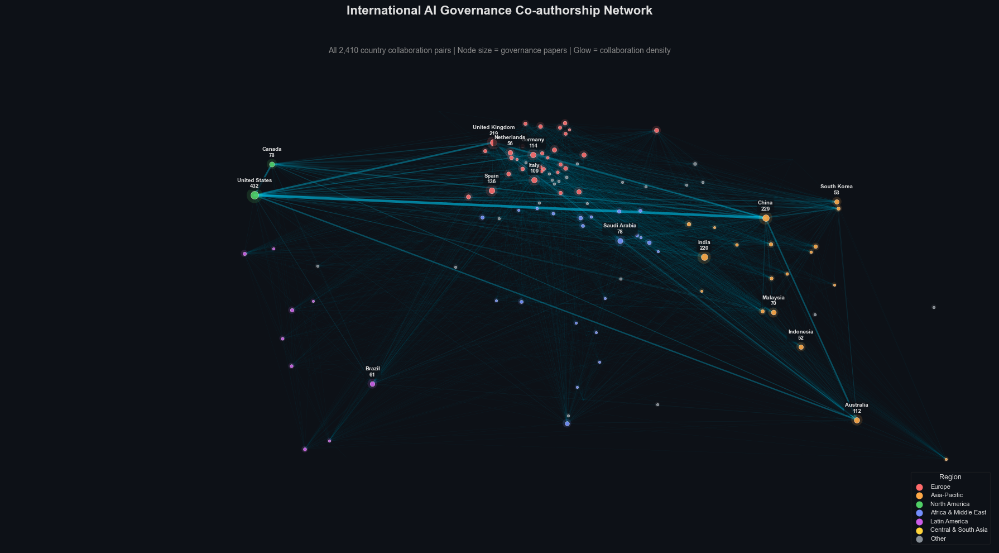

In [13]:
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
from matplotlib.collections import LineCollection

# ── Force non-interactive backend for notebook ──
%matplotlib inline

edges['paper_count'] = pd.to_numeric(edges['paper_count'])
edges['lat_a'] = pd.to_numeric(edges['lat_a'])
edges['lon_a'] = pd.to_numeric(edges['lon_a'])
edges['lat_b'] = pd.to_numeric(edges['lat_b'])
edges['lon_b'] = pd.to_numeric(edges['lon_b'])

# ── Country paper counts ──
country_papers = papers[papers['country'] != 'Unknown']['country'].value_counts().reset_index()
country_papers.columns = ['country', 'papers']
cp_map = dict(zip(country_papers['country'], country_papers['papers']))

# ── Node data ──
node_data = nodes.copy()
node_data['lat'] = pd.to_numeric(node_data['lat'])
node_data['lon'] = pd.to_numeric(node_data['lon'])
node_data['papers'] = node_data['country'].map(cp_map).fillna(0).astype(int)

# ── Region colours ──
region_colors = {
    'Europe': '#ff6b6b',
    'Asia-Pacific': '#ffa947',
    'North America': '#51cf66',
    'Africa & Middle East': '#748ffc',
    'Latin America': '#cc5de8',
    'Central & South Asia': '#ffd43b',
    'Other': '#868e96',
}

# ── Figure setup: dark background ──
fig, ax = plt.subplots(1, 1, figsize=(18, 10), facecolor='#0d1117')
ax.set_facecolor('#0d1117')

# ── Draw world boundaries from nodes' country positions (simple approach) ──
# We'll use a simple world outline
world_lons = np.linspace(-180, 180, 500)

# ── Draw ALL edges ──
max_weight = edges['paper_count'].max()
min_weight = edges['paper_count'].min()

for _, row in edges.iterrows():
    weight = row['paper_count']
    # Normalize weight for alpha and linewidth
    norm_w = (weight - min_weight) / (max_weight - min_weight + 1)
    alpha = 0.05 + 0.5 * norm_w
    lw = 0.3 + 3.0 * norm_w

    ax.plot(
        [row['lon_a'], row['lon_b']],
        [row['lat_a'], row['lat_b']],
        color='#00d4ff',
        alpha=alpha,
        linewidth=lw,
        zorder=1
    )

# ── Draw nodes with glow ──
for _, row in node_data.iterrows():
    p = row['papers']
    if p == 0:
        continue
    size = max(5, np.sqrt(p) * 2.5)
    region = row.get('region', 'Other')
    color = region_colors.get(region, '#868e96')

    # Glow
    ax.scatter(row['lon'], row['lat'], s=size * 8, color=color,
               alpha=0.15, zorder=2, edgecolors='none')
    # Node
    ax.scatter(row['lon'], row['lat'], s=size * 2, color=color,
               alpha=0.9, zorder=3, edgecolors='white', linewidths=0.3)

# ── Labels for top 15 ──
top15 = node_data.nlargest(15, 'papers')
for _, row in top15.iterrows():
    ax.annotate(
        f"{row['country']}\n{row['papers']:,}",
        xy=(row['lon'], row['lat']),
        fontsize=7, fontweight='bold', color='#e0e0e0',
        ha='center', va='bottom',
        xytext=(0, 8), textcoords='offset points',
        bbox=dict(boxstyle='round,pad=0.2', facecolor='#0d1117',
                  edgecolor='none', alpha=0.7),
        zorder=5
    )

# ── Region legend ──
for i, (region, color) in enumerate(region_colors.items()):
    ax.scatter([], [], c=color, s=60, label=region)
legend = ax.legend(loc='lower right', fontsize=8, framealpha=0.3,
                   facecolor='#0d1117', edgecolor='#333',
                   labelcolor='#e0e0e0', title='Region',
                   title_fontsize=9)
legend.get_title().set_color('#e0e0e0')

# ── Axis limits and cleanup ──
ax.set_xlim(-180, 180)
ax.set_ylim(-60, 85)
ax.set_aspect('auto')
ax.axis('off')

ax.set_title('International AI Governance Co-authorship Network',
             fontsize=16, fontweight='bold', color='#e0e0e0', pad=15)
ax.text(0.5, 0.96, f'All {len(edges):,} country collaboration pairs | Node size = governance papers | Glow = collaboration density',
        transform=ax.transAxes, fontsize=10, color='#888',
        ha='center', va='top')

plt.tight_layout()

plt.show()

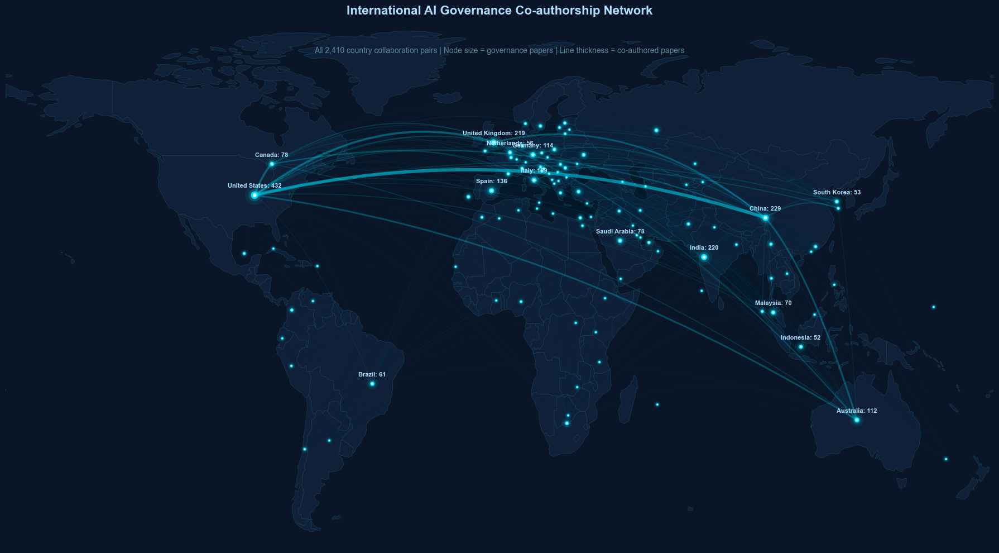

In [14]:
plt.close('all')
import matplotlib
matplotlib.rcParams['figure.facecolor'] = 'white'
matplotlib.rcParams['savefig.facecolor'] = 'white'
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
from matplotlib.patches import FancyArrowPatch
from matplotlib.path import Path
import matplotlib.patches as mpatches

world = gpd.read_file('https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip')

edges['paper_count'] = pd.to_numeric(edges['paper_count'])
edges['lat_a'] = pd.to_numeric(edges['lat_a'])
edges['lon_a'] = pd.to_numeric(edges['lon_a'])
edges['lat_b'] = pd.to_numeric(edges['lat_b'])
edges['lon_b'] = pd.to_numeric(edges['lon_b'])

country_papers = papers[papers['country'] != 'Unknown']['country'].value_counts().reset_index()
country_papers.columns = ['country', 'papers']
cp_map = dict(zip(country_papers['country'], country_papers['papers']))

node_data = nodes.copy()
node_data['lat'] = pd.to_numeric(node_data['lat'])
node_data['lon'] = pd.to_numeric(node_data['lon'])
node_data['papers'] = node_data['country'].map(cp_map).fillna(0).astype(int)

# ── Figure: dark navy background like reference ──
fig, ax = plt.subplots(1, 1, figsize=(18, 10), facecolor='#0a1628')
ax.set_facecolor('#0a1628')

# ── World map: dark fill, teal edges ──
world.plot(ax=ax, color='#0f2038', edgecolor='#1a4a5e', linewidth=0.4, zorder=0)

# ── Draw ALL edges: glowing cyan ──
max_weight = edges['paper_count'].max()
min_weight = edges['paper_count'].min()


for _, row in edges.iterrows():
    weight = row['paper_count']
    norm_w = (weight - min_weight) / (max_weight - min_weight + 1)
    alpha = 0.02 + 0.5 * norm_w
    lw = 0.15 + 4.0 * norm_w

    lon1, lat1 = row['lon_a'], row['lat_a']
    lon2, lat2 = row['lon_b'], row['lat_b']

    # Curved arc: midpoint raised proportional to distance
    mid_lon = (lon1 + lon2) / 2
    mid_lat = (lat1 + lat2) / 2
    dist = np.sqrt((lon2 - lon1)**2 + (lat2 - lat1)**2)
    curve_height = min(dist * 0.2, 20)
    mid_lat += curve_height

    # Draw quadratic bezier curve
    verts = [(lon1, lat1), (mid_lon, mid_lat), (lon2, lat2)]
    codes = [Path.MOVETO, Path.CURVE3, Path.CURVE3]
    path = Path(verts, codes)
    patch = mpatches.PathPatch(path, facecolor='none', edgecolor='#00e5ff',
                                alpha=alpha, linewidth=lw, zorder=1)
    ax.add_patch(patch)

# ── Draw nodes: glowing cyan dots ──
for _, row in node_data.iterrows():
    p = row['papers']
    if p == 0:
        continue
    size = max(8, np.sqrt(p) * 3)

    # Outer glow
    ax.scatter(row['lon'], row['lat'], s=size * 10, color='#00e5ff',
               alpha=0.08, zorder=2, edgecolors='none')
    # Mid glow
    ax.scatter(row['lon'], row['lat'], s=size * 4, color='#00e5ff',
               alpha=0.2, zorder=2, edgecolors='none')
    # Core dot
    ax.scatter(row['lon'], row['lat'], s=size * 1.5, color='#00e5ff',
               alpha=0.95, zorder=3, edgecolors='none')
    # Bright centre
    ax.scatter(row['lon'], row['lat'], s=size * 0.4, color='#ffffff',
               alpha=0.9, zorder=4, edgecolors='none')

# ── Labels: top 15 countries ──
top15 = node_data.nlargest(15, 'papers')
for _, row in top15.iterrows():
    ax.annotate(
        f"{row['country']}: {row['papers']}",
        xy=(row['lon'], row['lat']),
        fontsize=8, fontweight='bold', color='#b0e0ff',
        ha='center', va='bottom',
        xytext=(0, 8), textcoords='offset points',
        zorder=5
    )

# ── Axis ──
ax.set_xlim(-180, 180)
ax.set_ylim(-60, 85)
ax.set_aspect('auto')
ax.axis('off')

ax.set_title('International AI Governance Co-authorship Network',
             fontsize=16, fontweight='bold', color='#b0e0ff', pad=15)
ax.text(0.5, 0.96,
        f'All {len(edges):,} country collaboration pairs | Node size = governance papers | Line thickness = co-authored papers',
        transform=ax.transAxes, fontsize=10, color='#5a8a9a', ha='center', va='top')

plt.tight_layout()
plt.savefig('coauthorship_network.png', dpi=150, facecolor='white', bbox_inches='tight')
plt.show()

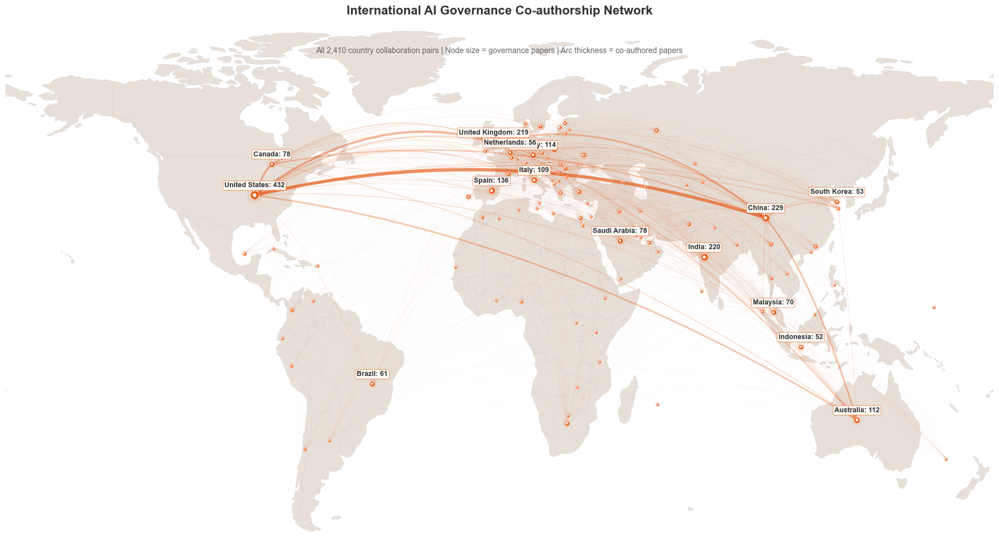

In [15]:
import matplotlib
matplotlib.rcParams['figure.facecolor'] = 'white'
matplotlib.rcParams['savefig.facecolor'] = 'white'

import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
from matplotlib.path import Path
import matplotlib.patches as mpatches

world = gpd.read_file('https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip')

edges['paper_count'] = pd.to_numeric(edges['paper_count'])
edges['lat_a'] = pd.to_numeric(edges['lat_a'])
edges['lon_a'] = pd.to_numeric(edges['lon_a'])
edges['lat_b'] = pd.to_numeric(edges['lat_b'])
edges['lon_b'] = pd.to_numeric(edges['lon_b'])

country_papers = papers[papers['country'] != 'Unknown']['country'].value_counts().reset_index()
country_papers.columns = ['country', 'papers']
cp_map = dict(zip(country_papers['country'], country_papers['papers']))

node_data = nodes.copy()
node_data['lat'] = pd.to_numeric(node_data['lat'])
node_data['lon'] = pd.to_numeric(node_data['lon'])
node_data['papers'] = node_data['country'].map(cp_map).fillna(0).astype(int)

max_weight = edges['paper_count'].max()
min_weight = edges['paper_count'].min()

# ── Figure: WHITE background, bright and clean ──
fig, ax = plt.subplots(1, 1, figsize=(18, 10), facecolor='white')
ax.set_facecolor('white')

# ── World map: warm beige like your choropleth maps ──
world.plot(ax=ax, color='#e8e0d8', edgecolor='#cccccc', linewidth=0.3, zorder=0)

# ── Draw ALL edges as curved arcs — BRIGHT orange-red to pop ──
for _, row in edges.iterrows():
    weight = row['paper_count']
    norm_w = (weight - min_weight) / (max_weight - min_weight + 1)
    alpha = 0.03 + 0.6 * norm_w
    lw = 0.2 + 4.0 * norm_w

    lon1, lat1 = row['lon_a'], row['lat_a']
    lon2, lat2 = row['lon_b'], row['lat_b']

    mid_lon = (lon1 + lon2) / 2
    mid_lat = (lat1 + lat2) / 2
    dist = np.sqrt((lon2 - lon1)**2 + (lat2 - lat1)**2)
    curve_height = min(dist * 0.2, 20)
    mid_lat += curve_height

    verts = [(lon1, lat1), (mid_lon, mid_lat), (lon2, lat2)]
    codes = [Path.MOVETO, Path.CURVE3, Path.CURVE3]
    path = Path(verts, codes)
    patch = mpatches.PathPatch(path, facecolor='none', edgecolor='#e6550d',
                                alpha=alpha, linewidth=lw, zorder=1)
    ax.add_patch(patch)

# ── Draw nodes: bright orange-red matching the arcs ──
for _, row in node_data.iterrows():
    p = row['papers']
    if p == 0:
        continue
    size = max(8, np.sqrt(p) * 3)

    # Glow
    ax.scatter(row['lon'], row['lat'], s=size * 6, color='#e6550d',
               alpha=0.10, zorder=2, edgecolors='none')
    # Core dot
    ax.scatter(row['lon'], row['lat'], s=size * 2, color='#e6550d',
               alpha=0.9, zorder=3, edgecolors='white', linewidths=0.5)
    # White centre
    ax.scatter(row['lon'], row['lat'], s=size * 0.4, color='#ffffff',
               alpha=0.9, zorder=4, edgecolors='none')

# ── Labels: top 15 countries, dark text with white background ──
top15 = node_data.nlargest(15, 'papers')
for _, row in top15.iterrows():
    ax.annotate(
        f"{row['country']}: {row['papers']}",
        xy=(row['lon'], row['lat']),
        fontsize=9, fontweight='bold', color='#333',
        ha='center', va='bottom',
        xytext=(0, 8), textcoords='offset points',
        bbox=dict(boxstyle='round,pad=0.2', facecolor='white',
                  edgecolor='#e6550d', alpha=0.85, linewidth=0.5),
        zorder=5
    )

# ── Axis ──
ax.set_xlim(-180, 180)
ax.set_ylim(-60, 85)
ax.set_aspect('auto')
ax.axis('off')

ax.set_title('International AI Governance Co-authorship Network',
             fontsize=16, fontweight='bold', color='#333', pad=15)
ax.text(0.5, 0.96,
        f'All {len(edges):,} country collaboration pairs | Node size = governance papers | Arc thickness = co-authored papers',
        transform=ax.transAxes, fontsize=10, color='#666', ha='center', va='top')

plt.tight_layout()
plt.savefig('coauthorship_network.png', dpi=150, facecolor='white', bbox_inches='tight')
plt.show()

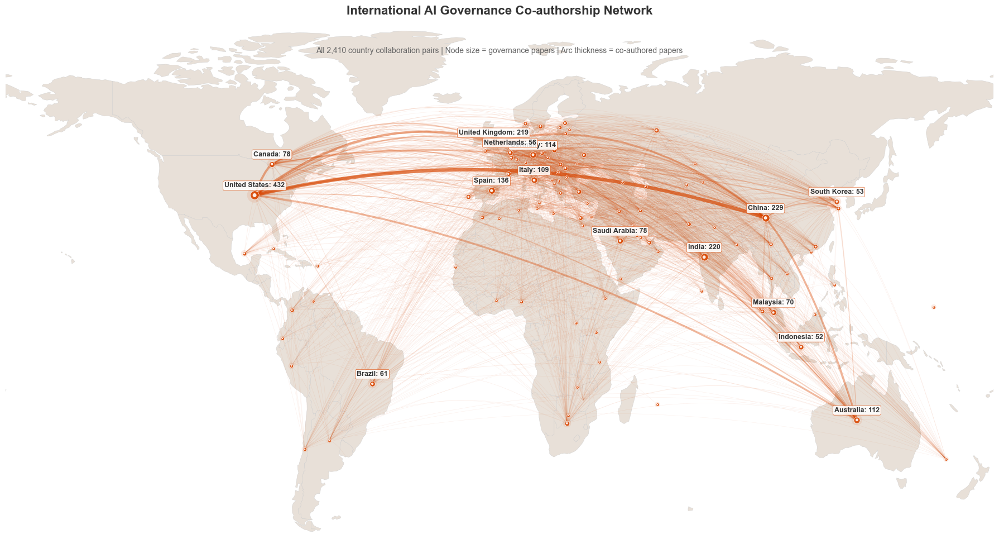

In [16]:
plt.close('all')

import matplotlib
matplotlib.rcParams['figure.facecolor'] = 'white'
matplotlib.rcParams['savefig.facecolor'] = 'white'

import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
from matplotlib.path import Path
import matplotlib.patches as mpatches

world = gpd.read_file('https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip')

edges['paper_count'] = pd.to_numeric(edges['paper_count'])
edges['lat_a'] = pd.to_numeric(edges['lat_a'])
edges['lon_a'] = pd.to_numeric(edges['lon_a'])
edges['lat_b'] = pd.to_numeric(edges['lat_b'])
edges['lon_b'] = pd.to_numeric(edges['lon_b'])

country_papers = papers[papers['country'] != 'Unknown']['country'].value_counts().reset_index()
country_papers.columns = ['country', 'papers']
cp_map = dict(zip(country_papers['country'], country_papers['papers']))

node_data = nodes.copy()
node_data['lat'] = pd.to_numeric(node_data['lat'])
node_data['lon'] = pd.to_numeric(node_data['lon'])
node_data['papers'] = node_data['country'].map(cp_map).fillna(0).astype(int)

max_weight = edges['paper_count'].max()
min_weight = edges['paper_count'].min()

fig, ax = plt.subplots(1, 1, figsize=(18, 10), facecolor='white')
ax.set_facecolor('white')

world.plot(ax=ax, color='#e8e0d8', edgecolor='#cccccc', linewidth=0.3, zorder=0)

# ── ALL edges as curved arcs — deeper orange, higher min opacity ──
for _, row in edges.iterrows():
    weight = row['paper_count']
    norm_w = (weight - min_weight) / (max_weight - min_weight + 1)
    alpha = 0.08 + 0.6 * norm_w
    lw = 0.4 + 4.0 * norm_w

    lon1, lat1 = row['lon_a'], row['lat_a']
    lon2, lat2 = row['lon_b'], row['lat_b']

    mid_lon = (lon1 + lon2) / 2
    mid_lat = (lat1 + lat2) / 2
    dist = np.sqrt((lon2 - lon1)**2 + (lat2 - lat1)**2)
    curve_height = min(dist * 0.2, 20)
    mid_lat += curve_height

    verts = [(lon1, lat1), (mid_lon, mid_lat), (lon2, lat2)]
    codes = [Path.MOVETO, Path.CURVE3, Path.CURVE3]
    path = Path(verts, codes)
    patch = mpatches.PathPatch(path, facecolor='none', edgecolor='#d94701',
                                alpha=alpha, linewidth=lw, zorder=1)
    ax.add_patch(patch)

# ── Nodes ──
for _, row in node_data.iterrows():
    p = row['papers']
    if p == 0:
        continue
    size = max(8, np.sqrt(p) * 3)

    ax.scatter(row['lon'], row['lat'], s=size * 6, color='#d94701',
               alpha=0.10, zorder=2, edgecolors='none')
    ax.scatter(row['lon'], row['lat'], s=size * 2, color='#d94701',
               alpha=0.9, zorder=3, edgecolors='white', linewidths=0.5)
    ax.scatter(row['lon'], row['lat'], s=size * 0.4, color='#ffffff',
               alpha=0.9, zorder=4, edgecolors='none')

# ── Labels: top 15 ──
top15 = node_data.nlargest(15, 'papers')
for _, row in top15.iterrows():
    ax.annotate(
        f"{row['country']}: {row['papers']}",
        xy=(row['lon'], row['lat']),
        fontsize=9, fontweight='bold', color='#333',
        ha='center', va='bottom',
        xytext=(0, 8), textcoords='offset points',
        bbox=dict(boxstyle='round,pad=0.2', facecolor='white',
                  edgecolor='#d94701', alpha=0.85, linewidth=0.5),
        zorder=5
    )

ax.set_xlim(-180, 180)
ax.set_ylim(-60, 85)
ax.set_aspect('auto')
ax.axis('off')

ax.set_title('International AI Governance Co-authorship Network',
             fontsize=16, fontweight='bold', color='#333', pad=15)
ax.text(0.5, 0.96,
        f'All {len(edges):,} country collaboration pairs | Node size = governance papers | Arc thickness = co-authored papers',
        transform=ax.transAxes, fontsize=10, color='#666', ha='center', va='top')

plt.tight_layout()
plt.savefig('coauthorship_network.png', dpi=150, facecolor='white', bbox_inches='tight')
plt.show()

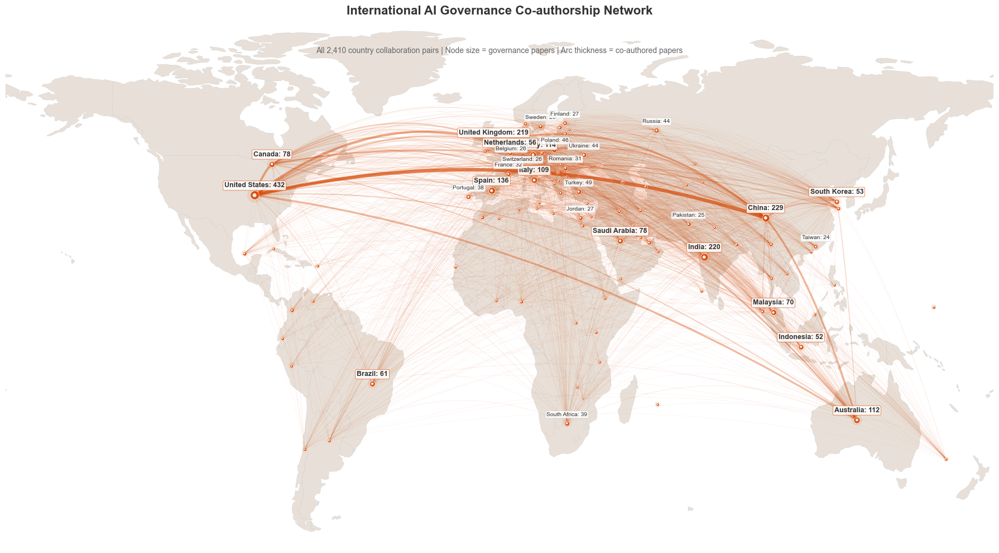

In [17]:
plt.close('all')

import matplotlib
matplotlib.rcParams['figure.facecolor'] = 'white'
matplotlib.rcParams['savefig.facecolor'] = 'white'

import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
from matplotlib.path import Path
import matplotlib.patches as mpatches

world = gpd.read_file('https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip')

edges['paper_count'] = pd.to_numeric(edges['paper_count'])
edges['lat_a'] = pd.to_numeric(edges['lat_a'])
edges['lon_a'] = pd.to_numeric(edges['lon_a'])
edges['lat_b'] = pd.to_numeric(edges['lat_b'])
edges['lon_b'] = pd.to_numeric(edges['lon_b'])

country_papers = papers[papers['country'] != 'Unknown']['country'].value_counts().reset_index()
country_papers.columns = ['country', 'papers']
cp_map = dict(zip(country_papers['country'], country_papers['papers']))

node_data = nodes.copy()
node_data['lat'] = pd.to_numeric(node_data['lat'])
node_data['lon'] = pd.to_numeric(node_data['lon'])
node_data['papers'] = node_data['country'].map(cp_map).fillna(0).astype(int)

max_weight = edges['paper_count'].max()
min_weight = edges['paper_count'].min()

fig, ax = plt.subplots(1, 1, figsize=(18, 10), facecolor='white')
ax.set_facecolor('white')

world.plot(ax=ax, color='#e8e0d8', edgecolor='#cccccc', linewidth=0.3, zorder=0)

for _, row in edges.iterrows():
    weight = row['paper_count']
    norm_w = (weight - min_weight) / (max_weight - min_weight + 1)
    alpha = 0.08 + 0.6 * norm_w
    lw = 0.4 + 4.0 * norm_w

    lon1, lat1 = row['lon_a'], row['lat_a']
    lon2, lat2 = row['lon_b'], row['lat_b']

    mid_lon = (lon1 + lon2) / 2
    mid_lat = (lat1 + lat2) / 2
    dist = np.sqrt((lon2 - lon1)**2 + (lat2 - lat1)**2)
    curve_height = min(dist * 0.2, 20)
    mid_lat += curve_height

    verts = [(lon1, lat1), (mid_lon, mid_lat), (lon2, lat2)]
    codes = [Path.MOVETO, Path.CURVE3, Path.CURVE3]
    path = Path(verts, codes)
    patch = mpatches.PathPatch(path, facecolor='none', edgecolor='#d94701',
                                alpha=alpha, linewidth=lw, zorder=1)
    ax.add_patch(patch)

for _, row in node_data.iterrows():
    p = row['papers']
    if p == 0:
        continue
    size = max(8, np.sqrt(p) * 3)

    ax.scatter(row['lon'], row['lat'], s=size * 6, color='#d94701',
               alpha=0.10, zorder=2, edgecolors='none')
    ax.scatter(row['lon'], row['lat'], s=size * 2, color='#d94701',
               alpha=0.9, zorder=3, edgecolors='white', linewidths=0.5)
    ax.scatter(row['lon'], row['lat'], s=size * 0.4, color='#ffffff',
               alpha=0.9, zorder=4, edgecolors='none')

# ── Labels: top 30 — bold for top 15, lighter for 16-30 ──
top30 = node_data.nlargest(30, 'papers')
top15_countries = node_data.nlargest(15, 'papers')['country'].tolist()

for _, row in top30.iterrows():
    is_top15 = row['country'] in top15_countries
    fontsize = 9 if is_top15 else 7.5
    fontweight = 'bold' if is_top15 else 'normal'
    edge_color = '#d94701' if is_top15 else '#ccc'

    ax.annotate(
        f"{row['country']}: {row['papers']}",
        xy=(row['lon'], row['lat']),
        fontsize=fontsize, fontweight=fontweight, color='#333',
        ha='center', va='bottom',
        xytext=(0, 8), textcoords='offset points',
        bbox=dict(boxstyle='round,pad=0.2', facecolor='white',
                  edgecolor=edge_color, alpha=0.85, linewidth=0.5),
        zorder=5
    )

ax.set_xlim(-180, 180)
ax.set_ylim(-60, 85)
ax.set_aspect('auto')
ax.axis('off')

ax.set_title('International AI Governance Co-authorship Network',
             fontsize=16, fontweight='bold', color='#333', pad=15)
ax.text(0.5, 0.96,
        f'All {len(edges):,} country collaboration pairs | Node size = governance papers | Arc thickness = co-authored papers',
        transform=ax.transAxes, fontsize=10, color='#666', ha='center', va='top')

plt.tight_layout()
plt.savefig('coauthorship_network_30.png', dpi=150, facecolor='white', bbox_inches='tight')
plt.show()

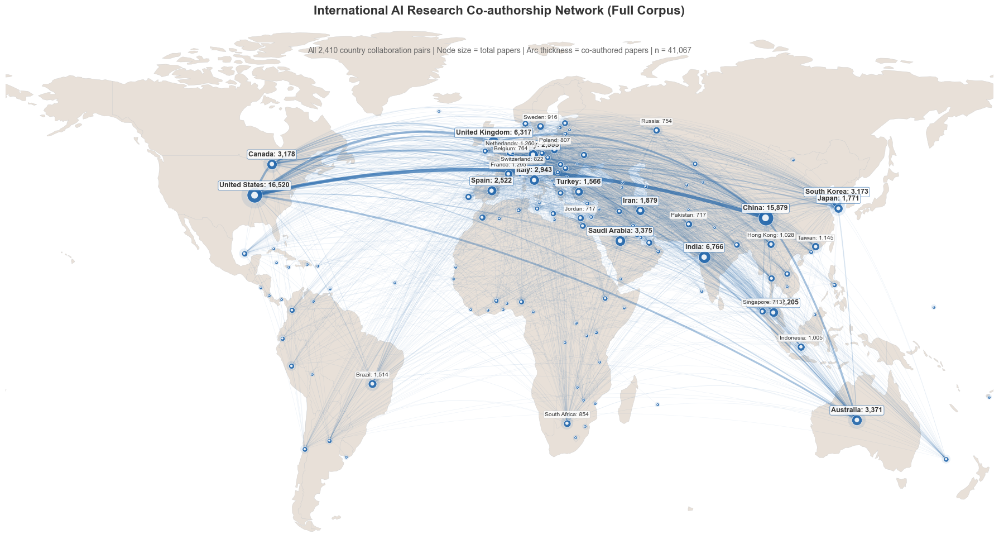

In [18]:
import matplotlib
matplotlib.rcParams['figure.facecolor'] = 'white'
matplotlib.rcParams['savefig.facecolor'] = 'white'

import matplotlib.pyplot as plt
plt.close('all')

import numpy as np
import geopandas as gpd
from matplotlib.path import Path
import matplotlib.patches as mpatches

world = gpd.read_file('https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip')

edges['paper_count'] = pd.to_numeric(edges['paper_count'])
edges['lat_a'] = pd.to_numeric(edges['lat_a'])
edges['lon_a'] = pd.to_numeric(edges['lon_a'])
edges['lat_b'] = pd.to_numeric(edges['lat_b'])
edges['lon_b'] = pd.to_numeric(edges['lon_b'])

node_data = nodes.copy()
node_data['lat'] = pd.to_numeric(node_data['lat'])
node_data['lon'] = pd.to_numeric(node_data['lon'])
node_data['total_papers'] = pd.to_numeric(node_data['total_papers'])

max_weight = edges['paper_count'].max()
min_weight = edges['paper_count'].min()

fig, ax = plt.subplots(1, 1, figsize=(18, 10), facecolor='white')
ax.set_facecolor('white')

world.plot(ax=ax, color='#e8e0d8', edgecolor='#cccccc', linewidth=0.3, zorder=0)

# ── ALL edges as curved arcs — deep blue ──
for _, row in edges.iterrows():
    weight = row['paper_count']
    norm_w = (weight - min_weight) / (max_weight - min_weight + 1)
    alpha = 0.08 + 0.6 * norm_w
    lw = 0.4 + 4.0 * norm_w

    lon1, lat1 = row['lon_a'], row['lat_a']
    lon2, lat2 = row['lon_b'], row['lat_b']

    mid_lon = (lon1 + lon2) / 2
    mid_lat = (lat1 + lat2) / 2
    dist = np.sqrt((lon2 - lon1)**2 + (lat2 - lat1)**2)
    curve_height = min(dist * 0.2, 20)
    mid_lat += curve_height

    verts = [(lon1, lat1), (mid_lon, mid_lat), (lon2, lat2)]
    codes = [Path.MOVETO, Path.CURVE3, Path.CURVE3]
    path = Path(verts, codes)
    patch = mpatches.PathPatch(path, facecolor='none', edgecolor='#2166ac',
                                alpha=alpha, linewidth=lw, zorder=1)
    ax.add_patch(patch)

# ── Nodes sized by total_papers ──
for _, row in node_data.iterrows():
    p = row['total_papers']
    if p == 0:
        continue
    size = max(8, np.sqrt(p) * 1.5)

    ax.scatter(row['lon'], row['lat'], s=size * 6, color='#2166ac',
               alpha=0.10, zorder=2, edgecolors='none')
    ax.scatter(row['lon'], row['lat'], s=size * 2, color='#2166ac',
               alpha=0.9, zorder=3, edgecolors='white', linewidths=0.5)
    ax.scatter(row['lon'], row['lat'], s=size * 0.4, color='#ffffff',
               alpha=0.9, zorder=4, edgecolors='none')

# ── Labels: top 15 bold, 16-30 lighter ──
top30 = node_data.nlargest(30, 'total_papers')
top15_countries = node_data.nlargest(15, 'total_papers')['country'].tolist()

for _, row in top30.iterrows():
    is_top15 = row['country'] in top15_countries
    fontsize = 9 if is_top15 else 7.5
    fontweight = 'bold' if is_top15 else 'normal'
    edge_color = '#2166ac' if is_top15 else '#ccc'

    ax.annotate(
        f"{row['country']}: {row['total_papers']:,}",
        xy=(row['lon'], row['lat']),
        fontsize=fontsize, fontweight=fontweight, color='#333',
        ha='center', va='bottom',
        xytext=(0, 8), textcoords='offset points',
        bbox=dict(boxstyle='round,pad=0.2', facecolor='white',
                  edgecolor=edge_color, alpha=0.85, linewidth=0.5),
        zorder=5
    )

ax.set_xlim(-180, 180)
ax.set_ylim(-60, 85)
ax.set_aspect('auto')
ax.axis('off')

ax.set_title('International AI Research Co-authorship Network (Full Corpus)',
             fontsize=16, fontweight='bold', color='#333', pad=15)
ax.text(0.5, 0.96,
        f'All {len(edges):,} country collaboration pairs | Node size = total papers | Arc thickness = co-authored papers | n = 41,067',
        transform=ax.transAxes, fontsize=10, color='#666', ha='center', va='top')

plt.tight_layout()
plt.savefig('coauthorship_network_full_corpus.png', dpi=150, facecolor='white', bbox_inches='tight')
plt.show()

### Visual 2.3 — Regional Governance Topic Distribution

In [19]:
import plotly.graph_objects as go
import pandas as pd

# ── Build region → topic flows ──
flows = papers[papers['country'] != 'Unknown'].groupby(['region', 'topic_label_finetuned']).size().reset_index(name='count')

# ── Calculate percentages ──
flows['topic_total'] = flows.groupby('topic_label_finetuned')['count'].transform('sum')
flows['pct'] = (flows['count'] / flows['topic_total'] * 100).round(1)

# ── Get unique regions and topics ──
regions = sorted(flows['region'].unique().tolist())
topics = flows.groupby('topic_label_finetuned')['count'].sum().sort_values(ascending=False).index.tolist()

# ── Build node list: regions first, then topics ──
all_nodes = regions + topics
node_indices = {name: i for i, name in enumerate(all_nodes)}

# ── Stance colours for topics ──
stance_map = dict(zip(
    papers.groupby('topic_label_finetuned')['stance'].agg(lambda x: x.mode()[0]).index,
    papers.groupby('topic_label_finetuned')['stance'].agg(lambda x: x.mode()[0]).values
))

stance_colors = {
    'risk_focused': 'rgba(225, 87, 89, 0.85)',
    'opportunity_focused': 'rgba(78, 121, 167, 0.85)',
    'balanced': 'rgba(118, 183, 178, 0.85)',
}

stance_colors_light = {
    'risk_focused': 'rgba(225, 87, 89, 0.3)',
    'opportunity_focused': 'rgba(78, 121, 167, 0.3)',
    'balanced': 'rgba(118, 183, 178, 0.3)',
}

# ── Node colours: regions = neutral grey, topics = stance colour ──
node_colors = []
for n in all_nodes:
    if n in regions:
        node_colors.append('rgba(120, 120, 120, 0.8)')
    else:
        stance = stance_map.get(n, 'balanced')
        node_colors.append(stance_colors.get(stance, 'rgba(180,180,180,0.8)'))

# ── Build links: coloured by topic stance ──
sources = []
targets = []
values = []
link_colors = []
custom_data = []

for _, row in flows.iterrows():
    src = node_indices[row['region']]
    tgt = node_indices[row['topic_label_finetuned']]
    sources.append(src)
    targets.append(tgt)
    values.append(row['count'])
    custom_data.append(row['pct'])

    stance = stance_map.get(row['topic_label_finetuned'], 'balanced')
    link_colors.append(stance_colors_light.get(stance, 'rgba(200,200,200,0.3)'))

# ── Shorten topic names, add percentage annotations ──
# ── Shorten topic names, show % of total governance papers ──
total_gov_papers = flows['count'].sum()
node_labels = []
for n in all_nodes:
    if n in regions:
        total = flows[flows['region'] == n]['count'].sum()
        pct = (total / total_gov_papers * 100)
        node_labels.append(f"{n} ({pct:.1f}%)")
    else:
        total = flows[flows['topic_label_finetuned'] == n]['count'].sum()
        pct = (total / total_gov_papers * 100)
        short = n if len(n) <= 30 else n[:28] + '…'
        node_labels.append(f"{short} ({pct:.1f}%)")

fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=12,
        thickness=20,
        line=dict(color='white', width=0.5),
        label=node_labels,
        color=node_colors,
        hovertemplate='<b>%{label}</b><extra></extra>',
    ),
    link=dict(
        source=sources,
        target=targets,
        value=values,
        color=link_colors,
        customdata=custom_data,
        hovertemplate='%{source.label} → %{target.label}<br>Papers: %{value}<br>Share of topic: %{customdata:.1f}%<extra></extra>',
    )
)])

fig.update_layout(
    title=dict(
        text='Governance Research Focus by Region<br>'
             '<sup>Left = regions (grey) | Right = topics coloured by dominant stance: '
             '<span style="color:#e15759">■ risk</span>  '
             '<span style="color:#4e79a7">■ opportunity</span>  '
             '<span style="color:#76b7b2">■ balanced</span>  '
             '| Flow width = paper count</sup>',
        x=0.5, font=dict(size=15, color='#333')
    ),
    paper_bgcolor='white',
    plot_bgcolor='white',
    font=dict(size=10, color='#333'),
    height=600,
    width=1000,
    margin=dict(l=10, r=10, t=100, b=10),
)


fig.show()

In [20]:
# ══════════════════════════════════════════
# OPTION 4 — GROUPED BAR CHART (Altair)
# ══════════════════════════════════════════
bar_data = papers[papers['country'] != 'Unknown'].groupby(
    ['region', 'topic_label_finetuned']).size().reset_index(name='count')

# Calculate proportion within each region
bar_data['region_total'] = bar_data.groupby('region')['count'].transform('sum')
bar_data['pct'] = (bar_data['count'] / bar_data['region_total'] * 100).round(1)

# Top 10 topics by total for readability
top10_topics = bar_data.groupby('topic_label_finetuned')['count'].sum().nlargest(10).index.tolist()
bar_data_top = bar_data[bar_data['topic_label_finetuned'].isin(top10_topics)]

region_order = ['North America', 'Europe', 'Asia-Pacific', 'Africa & Middle East', 'Latin America', 'Central & South Asia']

v2_3_bar = alt.Chart(bar_data_top).mark_bar().encode(
    x=alt.X('pct:Q', axis=alt.Axis(title='% of Regional Governance Papers', grid=False)),
    y=alt.Y('topic_label_finetuned:N',
            sort=alt.SortField('count', order='descending'),
            axis=alt.Axis(title=None, labelLimit=300)),
    color=alt.Color('region:N',
                    scale=alt.Scale(
                        domain=region_order,
                        range=['#59a14f', '#e15759', '#4e79a7', '#f28e2b', '#b07aa1', '#edc948']
                    ),
                    legend=alt.Legend(title='Region', orient='right')),
    tooltip=[
        alt.Tooltip('topic_label_finetuned:N', title='Topic'),
        alt.Tooltip('region:N', title='Region'),
        alt.Tooltip('count:Q', title='Papers'),
        alt.Tooltip('pct:Q', title='% of Region', format='.1f'),
    ],
    yOffset='region:N',
).properties(
    width=600, height=500,
    title=alt.TitleParams(
        'Regional Focus on AI Governance Topics (Top 10)',
        subtitle='Percentage of each region\'s governance papers by topic',
        fontSize=15, subtitleFontSize=11
    )
).configure_view(strokeWidth=0).configure_axis(labelFontSize=10)

v2_3_bar

alt.Chart(...)

### Visual 2.4 — Dot Map: Countries Positioned by Coordinates
Each country at its geographic centroid, sized by governance paper count.

In [21]:
# ── Build dot data from nodes (already has coordinates and region) ──
country_papers_map = papers[papers['country'] != 'Unknown'].groupby('country').size().to_dict()

dot_data = nodes.copy()
dot_data['lat'] = pd.to_numeric(dot_data['lat'])
dot_data['lon'] = pd.to_numeric(dot_data['lon'])
dot_data['papers'] = dot_data['country'].map(country_papers_map).fillna(0).astype(int)
dot_data = dot_data[dot_data['papers'] > 0]

world_topo = alt.topo_feature(vega_data.world_110m.url, 'countries')

background2 = alt.Chart(world_topo).mark_geoshape(
    fill='#e8e0d8', stroke='white', strokeWidth=0.5
).project('naturalEarth1')

# ── Top 15 labels ──
top15 = dot_data.nlargest(15, 'papers').copy()
top15['display'] = top15.apply(lambda r: f"{r['country']}: {r['papers']}", axis=1)

lbl_halo = alt.Chart(top15).mark_text(
    fontSize=8.5, fontWeight='bold', stroke='white', strokeWidth=3, color='white', dy=-12
).encode(longitude='lon:Q', latitude='lat:Q', text='display:N')

lbl_text = alt.Chart(top15).mark_text(
    fontSize=8.5, fontWeight='bold', color='#333', dy=-12
).encode(longitude='lon:Q', latitude='lat:Q', text='display:N')

region_order = ['North America', 'Europe', 'Asia-Pacific', 'Africa & Middle East', 'Latin America', 'Central & South Asia']
region_colors = ['#59a14f', '#e15759', '#4e79a7', '#f28e2b', '#b07aa1', '#edc948']

dots = alt.Chart(dot_data).mark_circle(opacity=0.8, stroke='white', strokeWidth=0.5).encode(
    longitude='lon:Q',
    latitude='lat:Q',
    size=alt.Size('papers:Q',
                  scale=alt.Scale(range=[20, 2500]),
                  legend=alt.Legend(title='Governance Papers')),
    color=alt.Color('region:N',
                    scale=alt.Scale(domain=region_order, range=region_colors),
                    legend=alt.Legend(title='Region')),
    tooltip=[
        alt.Tooltip('country:N', title='Country'),
        alt.Tooltip('region:N', title='Region'),
        alt.Tooltip('papers:Q', title='Governance Papers'),
    ]
).project(type='naturalEarth1')

(background2 + dots + lbl_halo + lbl_text).properties(
    width=850, height=460,
    title=alt.TitleParams(
        'AI Governance Research Output by Country',
        subtitle='Each dot = one country at geographic centroid | Size = paper count | Colour = region',
        fontSize=15, subtitleFontSize=11
    )
).configure_view(strokeWidth=0)

alt.LayerChart(...)

### Visual 2.5 — Regional Stance Profiles (Faceted Bar)

In [22]:
# Faceted: one panel per region showing stance breakdown
sr2 = s_region.copy()
sr2 = sr2[sr2['region'] != 'Other / Unclassified']
sr2_melted = sr2.melt(
    id_vars=['region','paper_count','dominant_stance'],
    value_vars=['risk_focused','opportunity_focused','balanced'],
    var_name='stance', value_name='proportion'
)
sr2_melted['proportion_pct'] = (sr2_melted['proportion'] * 100).round(1)
sr2_melted['stance_label'] = sr2_melted['stance'].str.replace('_', ' ').str.title()

v10 = alt.Chart(sr2_melted).mark_bar(cornerRadiusTopLeft=3, cornerRadiusTopRight=3).encode(
    x=alt.X('stance_label:N',
            axis=alt.Axis(title='', labelAngle=-30, labelFontSize=10),
            sort=['Risk Focused', 'Balanced', 'Opportunity Focused']),
    y=alt.Y('proportion_pct:Q',
            axis=alt.Axis(title='% of Papers', grid=True, gridOpacity=0.3)),
    color=alt.Color('stance:N',
                    scale=alt.Scale(domain=STANCE_DOMAIN, range=STANCE_RANGE),
                    legend=None),
    tooltip=[
        alt.Tooltip('region:N', title='Region'),
        alt.Tooltip('stance_label:N', title='Stance'),
        alt.Tooltip('proportion_pct:Q', title='%', format='.1f'),
    ]
).facet(
    facet=alt.Facet('region:N', title=''),
    columns=5
).properties(
    title=alt.TitleParams(
        'AI Governance Stance by World Region',
        subtitle='Europe = most risk-focused | Africa & ME = most opportunity-focused',
        fontSize=15, subtitleFontSize=11
    )
)

v10

alt.FacetChart(...)

---
## 📜 RO3 — Academic vs Policy Alignment

> *Where do academic governance discourse and national AI policy frameworks converge or diverge?*

**5 visualisations:**
1. Alignment Bubble Chart (academic papers vs policy chunks)
2. Connected Dot Plot — shared topic coverage gap
3. Policy Heatmap — country × topic
4. EU Vocabulary Dominance Chart
5. Topic Gap Bar — academic-only topics (absent from policy)

### Visual 3.1 — Policy Alignment
x = academic papers, y = policy chunks, size = governance score. Shows where each corpus is stronger.

In [23]:
# ── Filter to governance topics only ──
align = pd.read_csv('../results/cross_corpus_alignment_v2.csv')
gov_align = align[align['governance_score'] >= 0.5].copy()
gov_align = gov_align.sort_values('scopus_count', ascending=True)

topic_order = gov_align['topic_label'].tolist()

# ── LEFT: Academic bars (reversed axis) ──
left = alt.Chart(gov_align).mark_bar(cornerRadius=3).encode(
    x=alt.X('scopus_count:Q',
            sort='descending',
            axis=alt.Axis(title='← Academic Papers', grid=False)),
    y=alt.Y('topic_label:N', sort=topic_order,
            axis=alt.Axis(title=None, labelLimit=280, labelFontSize=9)),
    color=alt.Color('alignment:N',
                    scale=alt.Scale(
                        domain=['shared', 'academic_only'],
                        range=['#1a9878', '#4e79a7']
                    ),
                    legend=alt.Legend(title='Alignment', orient='top')),
    tooltip=[
        alt.Tooltip('topic_label:N', title='Topic'),
        alt.Tooltip('scopus_count:Q', title='Academic Papers'),
        alt.Tooltip('policy_count:Q', title='Policy Chunks'),
        alt.Tooltip('alignment:N', title='Alignment'),
    ]
).properties(width=350, height=550)

# ── Academic count labels ──
left_labels = alt.Chart(gov_align).mark_text(
    align='left', dx=3, fontSize=8, color='white', fontWeight='bold'
).encode(
    x=alt.X('scopus_count:Q', sort='descending'),
    y=alt.Y('topic_label:N', sort=topic_order),
    text=alt.Text('scopus_count:Q'),
)

left_chart = (left + left_labels)

# ── RIGHT: Policy bars ──
right = alt.Chart(gov_align).mark_bar(cornerRadius=3).encode(
    x=alt.X('policy_count:Q',
            axis=alt.Axis(title='Policy Chunks →', grid=False)),
    y=alt.Y('topic_label:N', sort=topic_order, axis=None),
    color=alt.Color('alignment:N',
                    scale=alt.Scale(
                        domain=['shared', 'academic_only'],
                        range=['#1a9878', '#4e79a7']
                    ),
                    legend=None),
    tooltip=[
        alt.Tooltip('topic_label:N', title='Topic'),
        alt.Tooltip('scopus_count:Q', title='Academic Papers'),
        alt.Tooltip('policy_count:Q', title='Policy Chunks'),
        alt.Tooltip('alignment:N', title='Alignment'),
    ]
).properties(width=350, height=550)

# ── Policy count labels ──
right_labels = alt.Chart(gov_align).mark_text(
    align='left', dx=5, fontSize=8, color='#333', fontWeight='bold'
).encode(
    x='policy_count:Q',
    y=alt.Y('topic_label:N', sort=topic_order),
    text=alt.Text('policy_count:Q'),
)

right_chart = (right + right_labels)

# ── Combine side by side ──
v3_1 = alt.hconcat(
    left_chart, right_chart, spacing=0
).resolve_scale(
    color='shared'
).properties(
    title=alt.TitleParams(
        'Academic vs Policy Coverage of AI Governance Topics',
        subtitle='← Academic papers | Policy chunks → | Green = shared | Blue = academic only (policy gap)',
        fontSize=15, subtitleFontSize=11,
        anchor='middle'
    )
).configure_view(strokeWidth=0).configure_axis(labelFontSize=10)

v3_1

alt.HConcatChart(...)

### Visual 3.2 — Connected Dot Plot: Shared Topic Coverage Gap

In [24]:
shared_al = align[(align['alignment'] == 'shared') & (align['governance_score'] >= 0.5)].copy()
shared_al['short'] = shared_al['topic_label'].str[:38]
shared_al = shared_al.sort_values('scopus_count', ascending=True)

# Melt to long format for dumbell
dum = shared_al.melt(
    id_vars=['topic_label','short','governance_score'],
    value_vars=['scopus_count','policy_count'],
    var_name='corpus', value_name='count'
)
dum['corpus_label'] = dum['corpus'].map({
    'scopus_count': 'Academic Papers',
    'policy_count': 'Policy Chunks'
})

# Lines connecting the two points
v12_lines = alt.Chart(shared_al).mark_rule(strokeWidth=2, color='#ccc').encode(
    y=alt.Y('short:N', sort=shared_al['short'].tolist()),
    x=alt.X('scopus_count:Q', axis=alt.Axis(title='Count')),
    x2='policy_count:Q'
)

v12_dots = alt.Chart(dum).mark_circle(size=120, opacity=0.9).encode(
    y=alt.Y('short:N',
            sort=shared_al['short'].tolist(),
            axis=alt.Axis(title='', labelFontSize=10)),
    x=alt.X('count:Q',
            axis=alt.Axis(title='Coverage (papers / chunks)', grid=True, gridOpacity=0.3)),
    color=alt.Color('corpus_label:N',
                    scale=alt.Scale(
                        domain=['Academic Papers', 'Policy Chunks'],
                        range=[MID, AMBER]
                    ),
                    legend=alt.Legend(title='Corpus', orient='top-right')),
    tooltip=[
        alt.Tooltip('topic_label:N', title='Topic'),
        alt.Tooltip('corpus_label:N', title='Corpus'),
        alt.Tooltip('count:Q', title='Count'),
    ]
)

v12 = (v12_lines + v12_dots).properties(
    width=580, height=380,
    title=alt.TitleParams(
        'Coverage Gap: Academic Papers vs Policy Chunks (Shared Topics)',
        subtitle='Wider gaps = greater divergence in depth of engagement',
        fontSize=15, subtitleFontSize=11
    )
).configure_view(strokeWidth=1)

v12

alt.LayerChart(...)

### Visual 3.3 — Policy Document Heatmap: Country × Topic

In [25]:
if not pol_docs.empty:
    pol = pol_docs.copy()
    pol['proportion_pct'] = pd.to_numeric(pol['proportion'], errors='coerce') * 100
    pol['short_topic'] = pol['topic_label_finetuned'].astype(str).str[:28]
    pol_agg = pol.groupby(['country','short_topic'])['proportion_pct'].max().reset_index()

    v13 = alt.Chart(pol_agg).mark_rect(stroke='white', strokeWidth=0.5).encode(
        x=alt.X('country:N',
                axis=alt.Axis(title='', labelAngle=-45, labelFontSize=9)),
        y=alt.Y('short_topic:N',
                sort=alt.SortField('proportion_pct', order='descending'),
                axis=alt.Axis(title='', labelFontSize=9)),
        color=alt.Color('proportion_pct:Q',
                        scale=alt.Scale(scheme='oranges'),
                        legend=alt.Legend(title='% Chunks')),
        tooltip=[
            alt.Tooltip('country:N', title='Country'),
            alt.Tooltip('short_topic:N', title='Topic'),
            alt.Tooltip('proportion_pct:Q', title='% of doc chunks', format='.1f'),
        ]
    ).properties(
        width=640, height=300,
        title=alt.TitleParams(
            'National AI Policy Topic Coverage',
            subtitle='Darker = more of that country\'s policy document covers that governance topic',
            fontSize=15, subtitleFontSize=11
        )
    )

    text_v13 = alt.Chart(pol_agg[pol_agg['proportion_pct'] > 30]).mark_text(
        fontSize=7, color='white', fontWeight='bold'
    ).encode(
        x='country:N',
        y=alt.Y('short_topic:N', sort=alt.SortField('proportion_pct', order='descending')),
        text=alt.Text('proportion_pct:Q', format='.0f')
    )

    from IPython.display import display
    display((v13 + text_v13).configure_view(step=18).configure_axis(labelFontSize=9))

alt.LayerChart(...)

### Visual 3.4 — EU Vocabulary Dominance in Global South
Which countries mirror EU AI Act language in their policy frameworks?

In [26]:
if not pol_docs.empty:
    eu_topic = pol_docs[
        pol_docs['topic_label_finetuned'].astype(str).str.contains('EU AI Regulation', na=False)
    ].copy()
    eu_topic['proportion_pct'] = pd.to_numeric(eu_topic['proportion'], errors='coerce') * 100
    eu_topic = eu_topic.sort_values('proportion_pct', ascending=True)

    region_order = ['North America', 'Europe', 'Asia-Pacific', 'Africa & Middle East', 'Latin America', 'Central & South Asia']
    region_colors = ['#59a14f', '#e15759', '#4e79a7', '#f28e2b', '#b07aa1', '#edc948']

    v14 = alt.Chart(eu_topic).mark_bar(cornerRadiusEnd=3).encode(
        x=alt.X('proportion_pct:Q',
                axis=alt.Axis(title='% of Policy Document Using EU Regulatory Language', grid=False)),
        y=alt.Y('country:N',
                sort=alt.SortField('proportion_pct', order='ascending'),
                axis=alt.Axis(title='')),
        color=alt.Color('region:N',
                        scale=alt.Scale(domain=region_order, range=region_colors),
                        legend=alt.Legend(title='Region')),
        tooltip=[
            alt.Tooltip('country:N', title='Country'),
            alt.Tooltip('region:N', title='Region'),
            alt.Tooltip('proportion_pct:Q', title='% of document', format='.1f'),
        ]
    ).properties(
        width=560, height=380,
        title=alt.TitleParams(
            'EU Regulatory Vocabulary in National AI Policy Frameworks',
            subtitle='100% = entire document mapped to EU AI Regulation topic | Global South mirrors EU language',
            fontSize=15, subtitleFontSize=11
        )
    )

    ref = alt.Chart(pd.DataFrame({'x': [50]})).mark_rule(
        strokeDash=[4, 3], color='red', opacity=0.5
    ).encode(x='x:Q')

    from IPython.display import display
    v3_4 = (v14 + ref).configure_view(strokeWidth=0).configure_axis(labelFontSize=10)
    display(v3_4)


alt.LayerChart(...)

### Visual 3.5 — Academic-Only Topics (Policy Gaps)
Governance themes well-studied in academia but completely absent from national AI policy frameworks.

In [27]:
acad_only = align[
    (align['alignment'] == 'academic_only') & (align['governance_score'] >= 0.5)
].copy().sort_values('scopus_count', ascending=True)
acad_only['short'] = acad_only['topic_label'].str[:42]

v15 = alt.Chart(acad_only).mark_bar(
    cornerRadiusTopLeft=4, cornerRadiusTopRight=4, color=MID
).encode(
    x=alt.X('scopus_count:Q',
            axis=alt.Axis(title='Academic Papers (no policy equivalent)')),
    y=alt.Y('short:N',
            sort=alt.SortField('scopus_count', order='ascending'),
            axis=alt.Axis(title='', labelFontSize=10)),
    opacity=alt.Opacity('governance_score:Q',
                         scale=alt.Scale(range=[0.4, 1.0]),
                         legend=alt.Legend(title='Gov. Score')),
    tooltip=[
        alt.Tooltip('topic_label:N', title='Topic'),
        alt.Tooltip('scopus_count:Q', title='Academic Papers'),
        alt.Tooltip('governance_score:Q', title='Gov. Score', format='.2f'),
        alt.Tooltip('top_words:N', title='Keywords'),
    ]
)

text_v15 = alt.Chart(acad_only).mark_text(
    align='left', dx=4, fontSize=9, color='#333'
).encode(
    x='scopus_count:Q',
    y=alt.Y('short:N', sort=alt.SortField('scopus_count', order='ascending')),
    text=alt.Text('scopus_count:Q', format='d')
)

(v15 + text_v15).properties(
    width=560, height=360,
    title=alt.TitleParams(
        'Policy Gaps: Governance Topics in Academia But Absent From Policy',
        subtitle='These are areas where governments have not yet formalised AI governance priorities',
        fontSize=15, subtitleFontSize=11
    )
).configure_view(strokeWidth=1).configure_axis(labelFontSize=10)

alt.LayerChart(...)

---
## 💬 Stance Analysis — Risk vs Opportunity Framing

> *Do academics frame AI governance as a risk to be managed or an opportunity to be harnessed?*

**5 visualisations:**
1. Diverging Bar — Risk vs Opportunity per topic
2. Slope Chart — Stance shift pre vs post ChatGPT per topic
3. Scatter — Individual paper stance scores
4. Period Comparison — Stacked bar pre vs post
5. Topic × Region Stance Heatmap

### Visual 4.1 — Diverging Bar: Risk vs Opportunity per Topic
Topics sorted by risk score. Red = risk-dominated, green = opportunity-dominated.

In [28]:
st2 = s_topic.copy().sort_values('avg_risk_score', ascending=False)
st2['short'] = st2['topic_label_finetuned'].str[:40]
# Encode opportunity as negative for diverging layout
st2['opp_neg'] = -st2['opportunity_focused']

risk_bar = alt.Chart(st2).mark_bar(color=RED, opacity=0.85).encode(
    y=alt.Y('short:N',
            sort=st2['short'].tolist(),
            axis=alt.Axis(title='', labelFontSize=9)),
    x=alt.X('risk_focused:Q',
            scale=alt.Scale(domain=[-0.8, 0.8]),
            axis=alt.Axis(title='← Opportunity-focused  |  Risk-focused →',
                           values=[-0.8,-0.6,-0.4,-0.2,0,0.2,0.4,0.6,0.8],
                           format='.0%')),
    tooltip=[alt.Tooltip('topic_label_finetuned:N'), alt.Tooltip('risk_focused:Q', format='.1%')]
)
opp_bar = alt.Chart(st2).mark_bar(color=GREEN, opacity=0.85).encode(
    y=alt.Y('short:N', sort=st2['short'].tolist()),
    x=alt.X('opp_neg:Q'),
    tooltip=[alt.Tooltip('topic_label_finetuned:N'), alt.Tooltip('opportunity_focused:Q', format='.1%')]
)
zero_rule = alt.Chart(pd.DataFrame({'x':[0]})).mark_rule(color='#333', strokeWidth=1.5).encode(x='x:Q')

v16 = (risk_bar + opp_bar + zero_rule).properties(
    width=560, height=500,
    title=alt.TitleParams(
        'Risk vs Opportunity Framing by Governance Topic',
        subtitle='Red = risk-focused papers | Green = opportunity-focused papers | Length = proportion',
        fontSize=15, subtitleFontSize=11
    )
).configure_view(strokeWidth=1).configure_axis(labelFontSize=9)

v16

alt.LayerChart(...)

### Visual 4.2 — Slope Chart: Pre vs Post ChatGPT Stance Shift

In [29]:
# Build topic-level stance by period from papers
stance_period_topic = papers.groupby(['period','topic_label_finetuned','stance']).size().reset_index(name='count')
spt_total = papers.groupby(['period','topic_label_finetuned']).size().reset_index(name='total')
stance_period_topic = stance_period_topic.merge(spt_total, on=['period','topic_label_finetuned'])
stance_period_topic['proportion'] = stance_period_topic['count'] / stance_period_topic['total']

# Focus on risk_focused stance
risk_shift = stance_period_topic[stance_period_topic['stance'] == 'risk_focused'].copy()
risk_shift['period_label'] = risk_shift['period'].map({
    'pre_chatgpt': 'Pre-ChatGPT', 'post_chatgpt': 'Post-ChatGPT'
})
risk_shift['proportion_pct'] = (risk_shift['proportion'] * 100).round(1)
risk_shift['short'] = risk_shift['topic_label_finetuned'].str[:30]

# Compute direction for colouring
pre_  = risk_shift[risk_shift['period'] == 'pre_chatgpt'][['topic_label_finetuned','proportion']].rename(columns={'proportion':'pre'})
post_ = risk_shift[risk_shift['period'] == 'post_chatgpt'][['topic_label_finetuned','proportion']].rename(columns={'proportion':'post'})
direction = pre_.merge(post_, on='topic_label_finetuned')
direction['direction'] = (direction['post'] - direction['pre']).apply(
    lambda x: 'More risk post-ChatGPT' if x > 0.02 else ('Less risk post-ChatGPT' if x < -0.02 else 'Stable')
)
risk_shift = risk_shift.merge(direction[['topic_label_finetuned','direction']], on='topic_label_finetuned', how='left')

lines_v17 = alt.Chart(risk_shift).mark_line(point=True, strokeWidth=2).encode(
    x=alt.X('period_label:O',
            sort=['Pre-ChatGPT','Post-ChatGPT'],
            axis=alt.Axis(title='', labelFontSize=12, labelFontWeight='bold')),
    y=alt.Y('proportion_pct:Q',
            axis=alt.Axis(title='% Risk-Focused Papers', grid=True, gridOpacity=0.3)),
    detail='topic_label_finetuned:N',
    color=alt.Color('direction:N',
                    scale=alt.Scale(
                        domain=['More risk post-ChatGPT','Less risk post-ChatGPT','Stable'],
                        range=[RED, GREEN, '#BBBBBB']
                    ),
                    legend=alt.Legend(title='Direction', orient='top-left')),
    opacity=alt.Opacity('direction:N',
                         scale=alt.Scale(
                             domain=['More risk post-ChatGPT','Less risk post-ChatGPT','Stable'],
                             range=[1, 1, 0.4]
                         ), legend=None),
    tooltip=[alt.Tooltip('topic_label_finetuned:N'), alt.Tooltip('proportion_pct:Q', format='.1f'), alt.Tooltip('direction:N')]
)

labels_v17 = alt.Chart(risk_shift[risk_shift['period'] == 'post_chatgpt']).mark_text(
    align='left', dx=6, fontSize=8
).encode(
    x=alt.X('period_label:O', sort=['Pre-ChatGPT','Post-ChatGPT']),
    y='proportion_pct:Q',
    text='short:N',
    color=alt.Color('direction:N',
                    scale=alt.Scale(
                        domain=['More risk post-ChatGPT','Less risk post-ChatGPT','Stable'],
                        range=[RED, GREEN, '#BBBBBB']
                    ), legend=None),
)

v17 = (lines_v17 + labels_v17).properties(
    width=360, height=560,
    title=alt.TitleParams(
        'Risk Framing Shift: Pre vs Post ChatGPT (by Topic)',
        subtitle='Red = became more risk-focused | Green = became less risk-focused after ChatGPT',
        fontSize=15, subtitleFontSize=11
    )
).configure_view(strokeWidth=0)

v17

alt.LayerChart(...)

### Visual 4.3 — Scatter: Individual Paper Stance Scores
Each dot = one governance paper. Position = (risk score, opportunity score). Colour = classified stance.

In [30]:
# Sample for performance if needed
sample = papers.sample(min(2000, len(papers)), random_state=42).copy()
sample['score_risk'] = pd.to_numeric(sample['score_risk'], errors='coerce')
sample['score_opportunity'] = pd.to_numeric(sample['score_opportunity'], errors='coerce')
sample = sample.dropna(subset=['score_risk','score_opportunity'])
sample['short_topic'] = sample['topic_label_finetuned'].str[:25]

selection = alt.selection_point(fields=['stance'], bind='legend')

v18 = alt.Chart(sample).mark_circle(size=25, opacity=0.5).encode(
    x=alt.X('score_risk:Q',
            scale=alt.Scale(domain=[0, 0.95]),
            axis=alt.Axis(title='Risk Score', grid=True, gridOpacity=0.2)),
    y=alt.Y('score_opportunity:Q',
            scale=alt.Scale(domain=[0, 0.95]),
            axis=alt.Axis(title='Opportunity Score', grid=True, gridOpacity=0.2)),
    color=alt.Color('stance:N',
                    scale=alt.Scale(domain=STANCE_DOMAIN, range=STANCE_RANGE),
                    legend=alt.Legend(title='Stance')),
    opacity=alt.condition(selection, alt.value(0.6), alt.value(0.05)),
    tooltip=[
        alt.Tooltip('title:N', title='Paper Title'),
        alt.Tooltip('stance:N', title='Stance'),
        alt.Tooltip('short_topic:N', title='Topic'),
        alt.Tooltip('country:N', title='Country'),
        alt.Tooltip('score_risk:Q', title='Risk Score', format='.3f'),
        alt.Tooltip('score_opportunity:Q', title='Opp Score', format='.3f'),
    ]
).add_params(selection).properties(
    width=580, height=500,
    title=alt.TitleParams(
        'Individual Paper Stance Scores (click legend to filter)',
        subtitle=f'n={len(sample):,} governance papers sampled | Click a stance in the legend to highlight',
        fontSize=15, subtitleFontSize=11
    )
)

diag_v18 = alt.Chart(pd.DataFrame({'x':[0,0.95],'y':[0,0.95]})).mark_line(
    strokeDash=[4,4], color='#999', opacity=0.4
).encode(x='x:Q', y='y:Q')

(diag_v18 + v18).configure_view(strokeWidth=1).configure_axis(labelFontSize=10)

alt.LayerChart(...)

### Visual 4.4 — Stacked Bar: Stance Distribution Pre vs Post ChatGPT

In [31]:
sp2 = s_period.copy()
sp2['period_label'] = sp2['period'].map({
    'pre_chatgpt': 'Pre-ChatGPT\n(2015–2021)',
    'post_chatgpt': 'Post-ChatGPT\n(2022–2025)'
})
sp2_melted = sp2.melt(
    id_vars=['period','period_label','paper_count'],
    value_vars=['risk_focused','opportunity_focused','balanced'],
    var_name='stance', value_name='proportion'
)
sp2_melted['proportion_pct'] = (sp2_melted['proportion'] * 100).round(1)
sp2_melted['stance_label'] = sp2_melted['stance'].str.replace('_',' ').str.title()

v19 = alt.Chart(sp2_melted).mark_bar(
    cornerRadiusTopLeft=3, cornerRadiusTopRight=3
).encode(
    x=alt.X('period_label:O',
            axis=alt.Axis(title='', labelFontSize=13, labelFontWeight='bold'),
            sort=['Pre-ChatGPT\n(2015–2021)', 'Post-ChatGPT\n(2022–2025)']),
    y=alt.Y('proportion_pct:Q',
            stack='zero',
            axis=alt.Axis(title='% of Papers')),
    color=alt.Color('stance:N',
                    scale=alt.Scale(domain=STANCE_DOMAIN, range=STANCE_RANGE),
                    legend=alt.Legend(title='Stance')),
    order=alt.Order('stance:N', sort='ascending'),
    tooltip=[alt.Tooltip('stance_label:N'), alt.Tooltip('proportion_pct:Q', format='.1f')]
)

text_v19 = alt.Chart(sp2_melted[sp2_melted['proportion_pct'] > 8]).mark_text(
    color='white', fontWeight='bold', fontSize=13
).encode(
    x=alt.X('period_label:O', sort=['Pre-ChatGPT\n(2015–2021)','Post-ChatGPT\n(2022–2025)']),
    y=alt.Y('proportion_pct:Q', stack='zero', bandPosition=0.5),
    text=alt.Text('proportion_pct:Q', format='.1f'),
    order=alt.Order('stance:N', sort='ascending'),
)

v19_chart = (v19 + text_v19).properties(
    width=380, height=420,
    title=alt.TitleParams(
        'Governance Research Stance: Pre vs Post ChatGPT',
        subtitle='Risk framing declined from 34.9% → 29.4% after ChatGPT | Opportunity framing surged',
        fontSize=15, subtitleFontSize=11
    )
)

v19_chart

alt.LayerChart(...)

### Visual 4.5 — Topic × Region Stance Heatmap
Which topics are framed as risks vs opportunities in each region?

In [32]:
# Build topic × region avg risk score
topic_region = papers.groupby(['topic_label_finetuned','region']).agg(
    avg_risk=('score_risk','mean'),
    papers=('scopus_id','count')
).reset_index()
topic_region = topic_region[topic_region['region'] != 'Other / Unclassified']
topic_region['short_topic'] = topic_region['topic_label_finetuned'].str[:32]
topic_region['avg_risk'] = pd.to_numeric(topic_region['avg_risk'], errors='coerce')

v20 = alt.Chart(topic_region).mark_rect().encode(
    x=alt.X('region:N',
            axis=alt.Axis(title='', labelAngle=-30, labelFontSize=11)),
    y=alt.Y('short_topic:N',
            sort=alt.SortField('avg_risk', order='descending'),
            axis=alt.Axis(title='', labelFontSize=9)),
    color=alt.Color('avg_risk:Q',
                    scale=alt.Scale(scheme='redblue', reverse=True, domain=[0.15, 0.65]),
                    legend=alt.Legend(title='Avg Risk Score')),
    tooltip=[
        alt.Tooltip('topic_label_finetuned:N', title='Topic'),
        alt.Tooltip('region:N', title='Region'),
        alt.Tooltip('avg_risk:Q', title='Avg Risk Score', format='.3f'),
        alt.Tooltip('papers:Q', title='Papers'),
    ]
).properties(
    width=360, height=460,
    title=alt.TitleParams(
        'Average Risk Framing by Topic and Region',
        subtitle='Red = risk-dominated framing | Blue = opportunity-dominated framing',
        fontSize=15, subtitleFontSize=11
    )
)

text_v20 = alt.Chart(topic_region[topic_region['avg_risk'] > 0.50]).mark_text(
    fontSize=8, color='white', fontWeight='bold'
).encode(
    x='region:N',
    y=alt.Y('short_topic:N', sort=alt.SortField('avg_risk', order='descending')),
    text=alt.Text('avg_risk:Q', format='.2f')
)

(v20 + text_v20).configure_view(step=22).configure_axis(labelFontSize=10)

alt.LayerChart(...)

---
## 💾 Export Charts for Paper

Run the cell below to save all visuals as SVG files in `results/figures/`.

In [33]:
import os

FIG_DIR = RESULTS / 'figures'
FIG_DIR.mkdir(exist_ok=True)

# To save an Altair chart as SVG:
# chart.save(str(FIG_DIR / 'v1_bubble.svg'))
# chart.save(str(FIG_DIR / 'v1_bubble.png'), scale_factor=2.0)

# Example:
# v1.save(str(FIG_DIR / 'ro1_bubble_chart.svg'))
# v6.save(str(FIG_DIR / 'ro2_world_map.svg'))
# v11.save(str(FIG_DIR / 'ro3_alignment_bubble.svg'))
# v16.save(str(FIG_DIR / 'stance_diverging_bar.svg'))

print(f'Save charts to: {FIG_DIR}')
print('Use: chart.save(str(FIG_DIR / "filename.svg"))')
print('Or:  chart.save(str(FIG_DIR / "filename.png"), scale_factor=2.0)')

Save charts to: /Users/tg.charumbira/PycharmProjects/AI-Research-Analysis-Capstone/results/figures
Use: chart.save(str(FIG_DIR / "filename.svg"))
Or:  chart.save(str(FIG_DIR / "filename.png"), scale_factor=2.0)
